# 9. Feature Selection

In [1]:
#載入套件
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import missingno as msno

#匯入自己寫的程式
import dataframe_format as ff
import human_read_data as hr
import plot_analysis as pa

In [2]:
df = pd.read_csv('7_noisy_data.csv')

In [3]:
df = hr.square_meter_to_ping(df)

In [4]:
print(len(df[(df['UnitPrice_ping'] > 5000000)]))
print(f'row_count: {len(df)}')
df = df[(df['UnitPrice_ping'] < 5000000)]
print(f'row_count: {len(df)}')

1
row_count: 104261
row_count: 104260


In [5]:
df.to_csv('square_meter_to_ping.csv', encoding='utf-8-sig', index=False)

In [6]:
#df = ff.reindex_noisydata(df)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 104260 entries, 0 to 104260
Data columns (total 46 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Identifier          104260 non-null  object 
 1   Num_Land            104260 non-null  int64  
 2   Num_Building        104260 non-null  int64  
 3   Num_ParkingSpace    104260 non-null  int64  
 4   Storeys             104260 non-null  float64
 5   Floor_Arabic        104260 non-null  float64
 6   Num_Floors          104260 non-null  float64
 7   HouseAge            104260 non-null  int64  
 8   CompletionYear      104260 non-null  int64  
 9   TransactionDate_AD  104260 non-null  int64  
 10  TransactionYear     104260 non-null  int64  
 11  TransactionMonth    104260 non-null  int64  
 12  Bedrooms            104260 non-null  int64  
 13  LivingRooms         104260 non-null  int64  
 14  Bathrooms           104260 non-null  int64  
 15  TotalArea           104260 non-null  fl

In [7]:
df.head()

,Identifier,Num_Land,Num_Building,Num_ParkingSpace,Storeys,Floor_Arabic,Num_Floors,HouseAge,CompletionYear,TransactionDate_AD,...,Num_Sec_School,NIMBY_Dist,Hospital_Dist,Metro_Dist,Railway_Dist,Primary_Dist,Sec_Dist,TotalPrice,UnitPrice_ping,TotalArea_ping
0,RPPNMLOJPHJFFAA17CA,1,1,0,5.0,2.0,1.0,31,1983,201405,...,1,1927.848709,986.810123,580.619237,5518.296523,434.611897,232.583754,11300000,3.787809e+05,29.832551
1,RPPSMLSJJIOFFCA28CA,3,1,0,18.0,10.0,1.0,9,2010,201910,...,2,5737.663362,1252.993661,30.933473,1646.111526,289.361797,265.468281,15930000,9.397065e+05,16.952101
2,RPSNMLTLQHNFFFA56CA,2,1,1,14.0,13.0,1.0,-2,2018,201601,...,2,4111.327471,828.428002,355.217298,2511.303778,332.255267,141.307329,33000000,1.051884e+06,31.372276
3,RPRNMLTLOHKFFAA08CA,1,1,0,4.0,1.0,1.0,38,1977,201504,...,2,2774.267401,1075.894739,815.794335,6311.609820,137.567134,240.123920,13000000,4.456160e+05,29.173101
4,RPSNMLOKOHNFFAA87CA,1,1,1,12.0,6.0,1.0,0,2018,201804,...,2,2769.399126,2020.580964,1371.877712,7063.465463,432.853701,376.047718,55500000,6.244336e+05,88.880553


# 9-1. Numurical Data

In [8]:
df.drop(columns=['CompletionYear', 'TransactionDate_AD', 'TransactionMonth'], axis=1, inplace=True)

In [9]:
df_num = df.select_dtypes(include = ['float64', 'int64'])

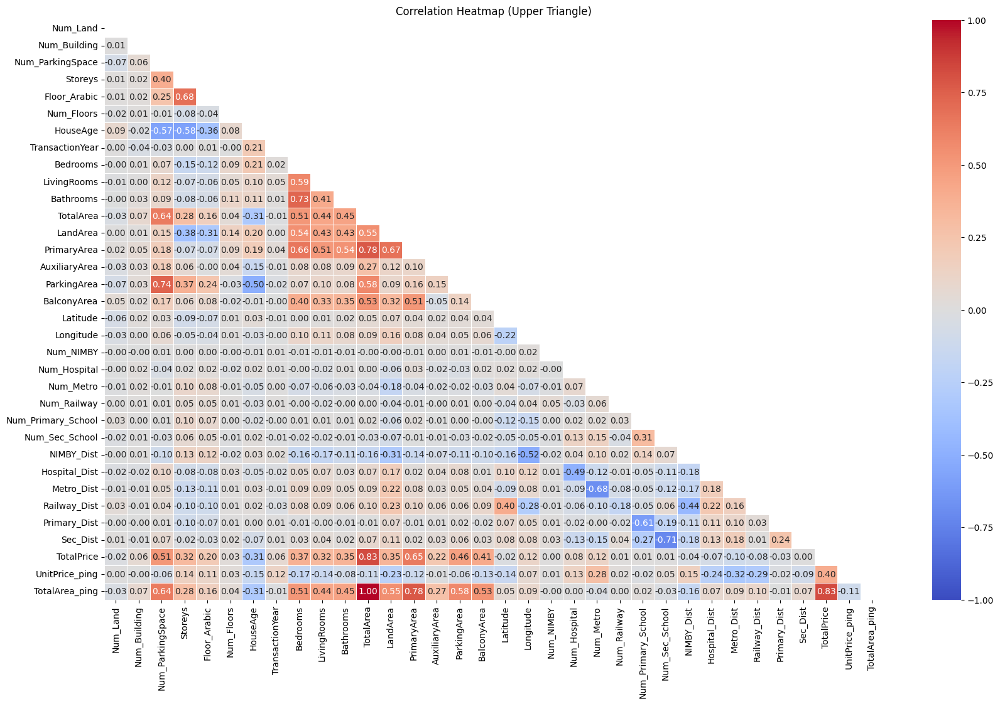

In [10]:
# Calculate the correlation coefficient matrix
pa.all_corr_heatmap(df)

In [11]:
# See features have a correlation greater than 0.2 with the TotalPrice
df_target = df.select_dtypes(include = ['float64', 'int64'])
#df_target.drop(columns=['Bathrooms', 'CompletionDate_AD', 'LivingRooms', 'PrimaryArea'], axis=1, inplace=True)

important_num = df_target.corr().loc['TotalPrice', (abs(df_target.corr()).TotalPrice > 0.2)& (df_target.corr().TotalPrice != 1)]
important_num

Num_ParkingSpace    0.511721
Storeys             0.315287
HouseAge           -0.309488
Bedrooms            0.370869
LivingRooms         0.319595
Bathrooms           0.353241
TotalArea           0.826590
LandArea            0.347350
PrimaryArea         0.645099
AuxiliaryArea       0.220874
ParkingArea         0.463983
BalconyArea         0.409425
UnitPrice_ping      0.396658
TotalArea_ping      0.826590
Name: TotalPrice, dtype: float64

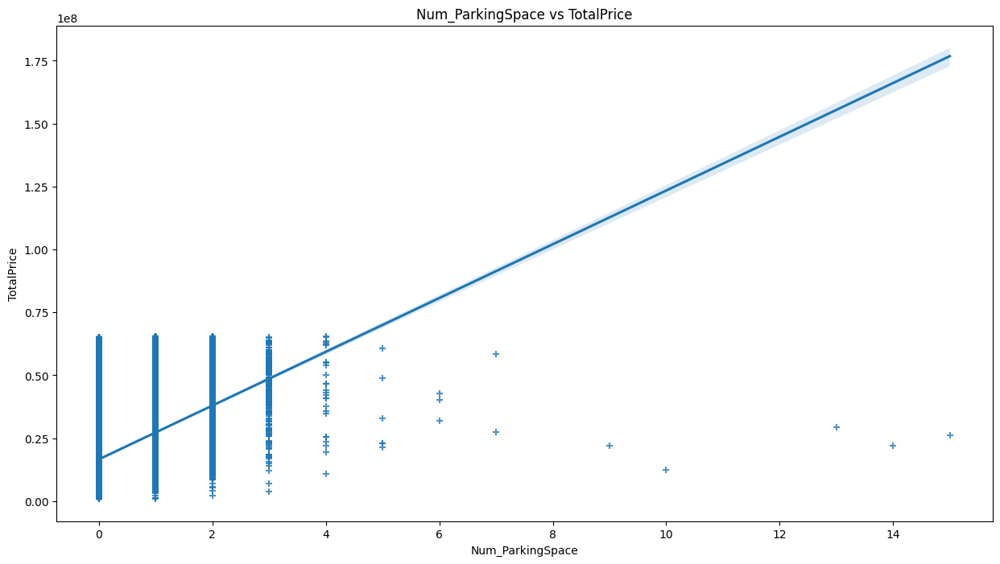

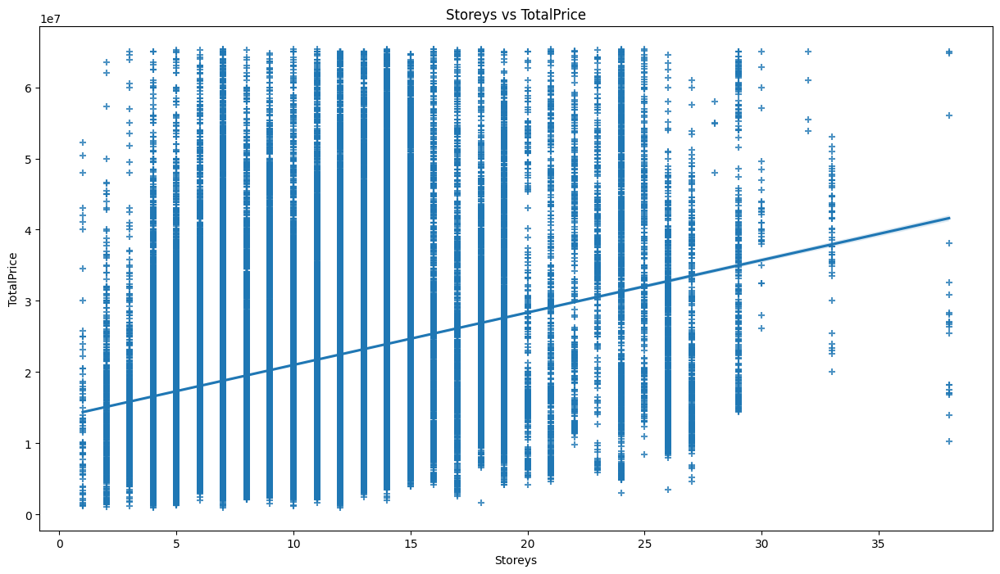

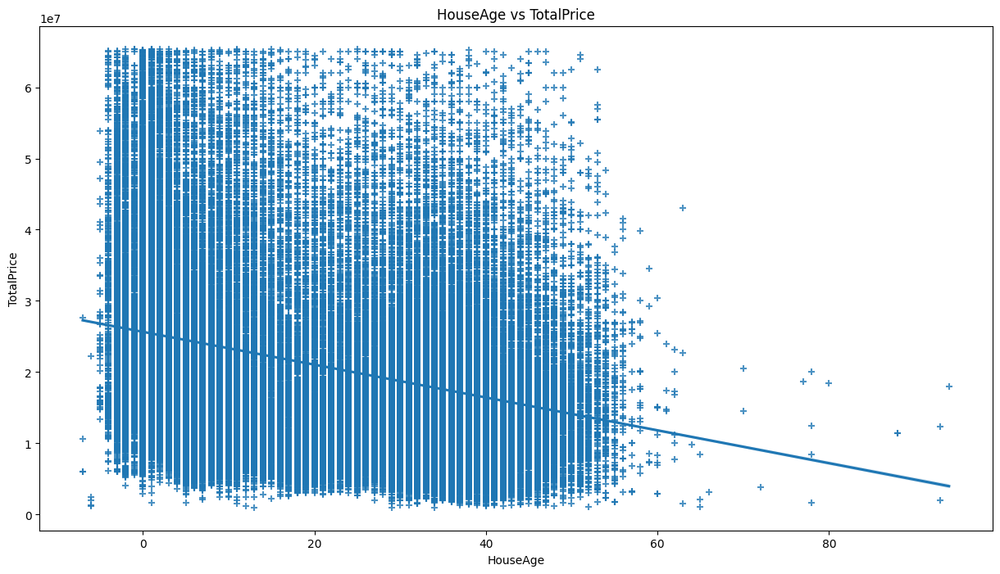

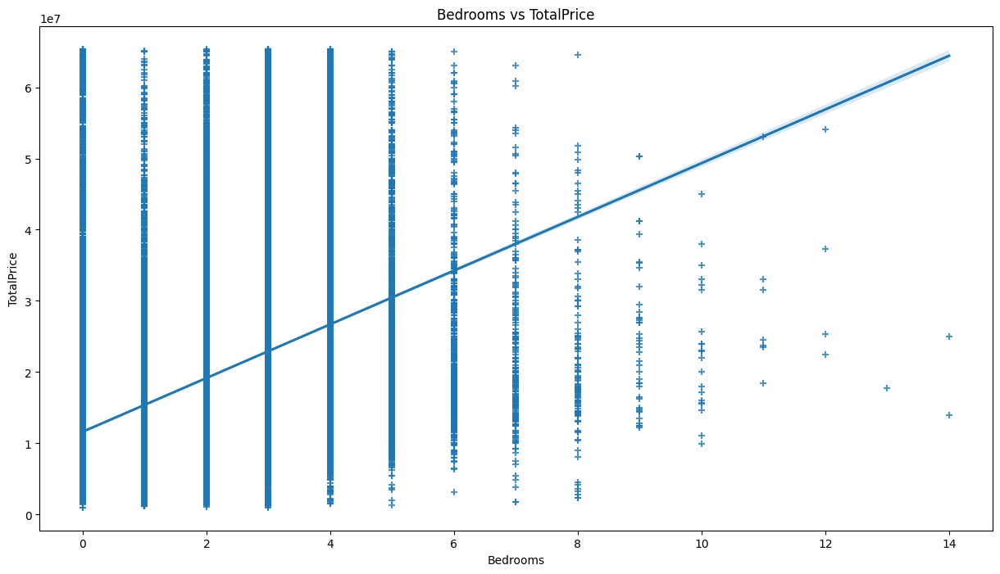

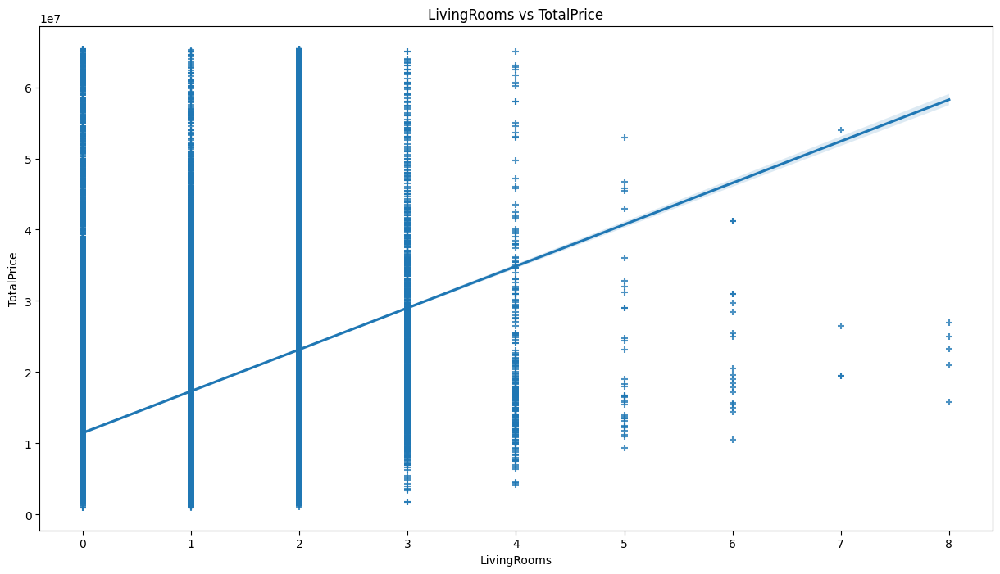

...

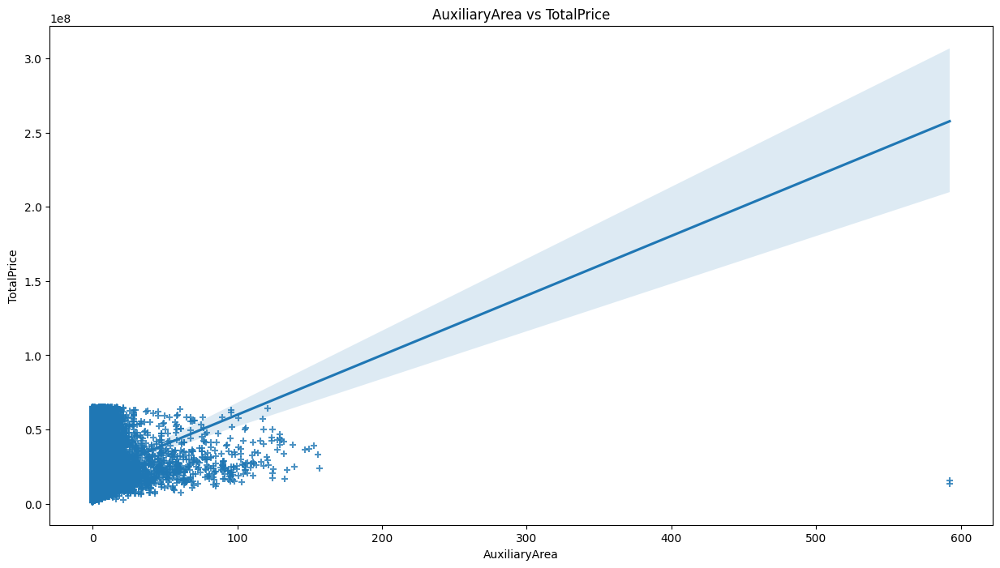

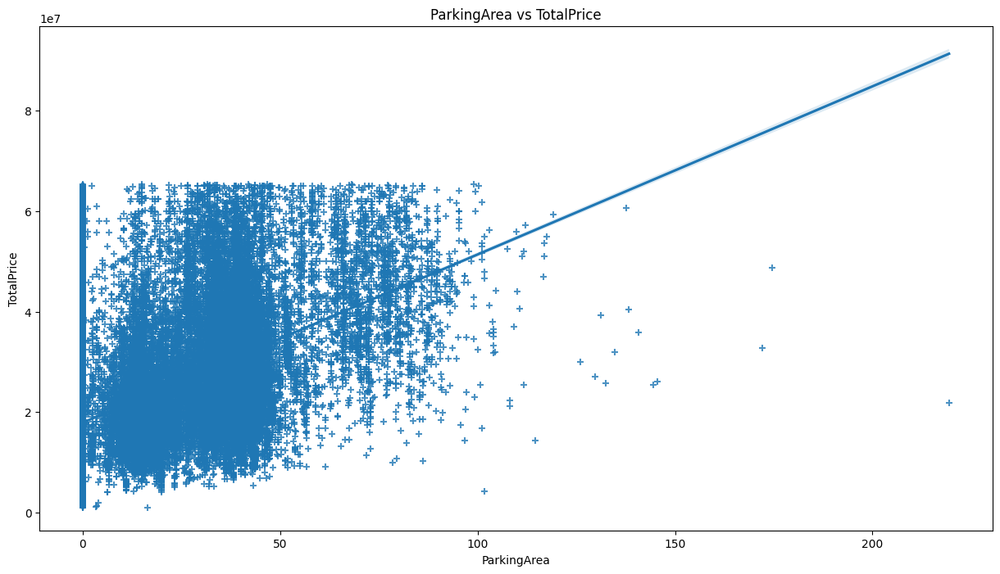

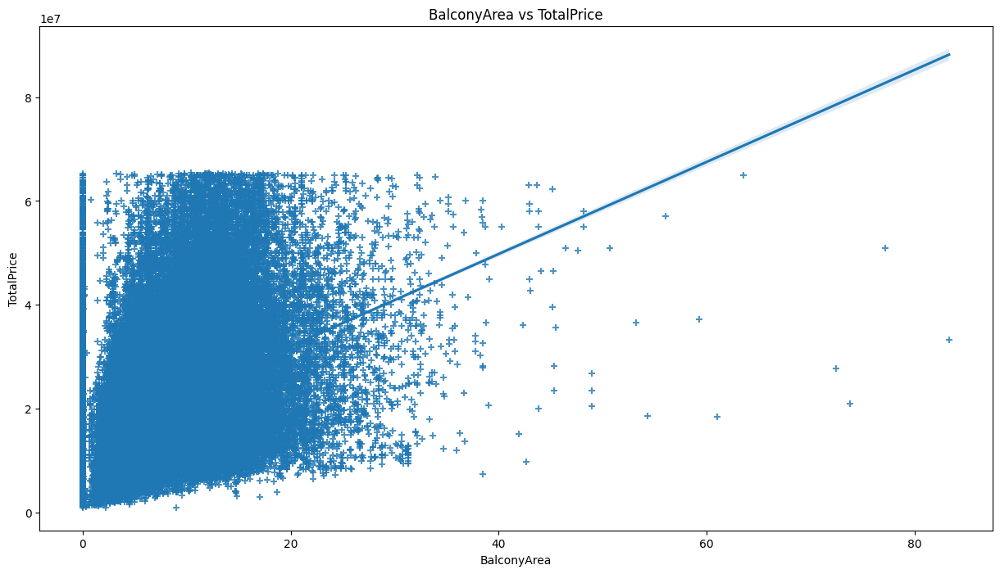

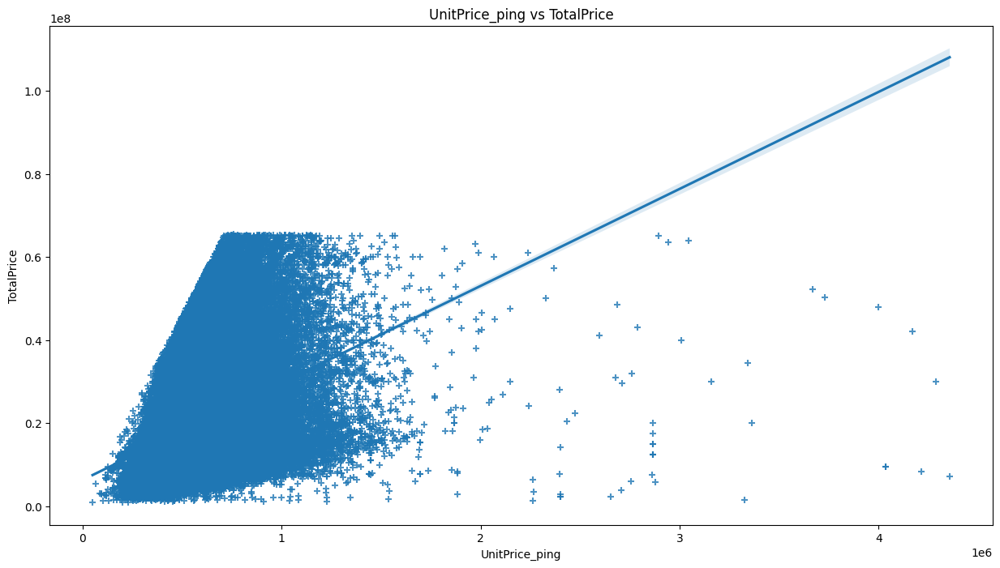

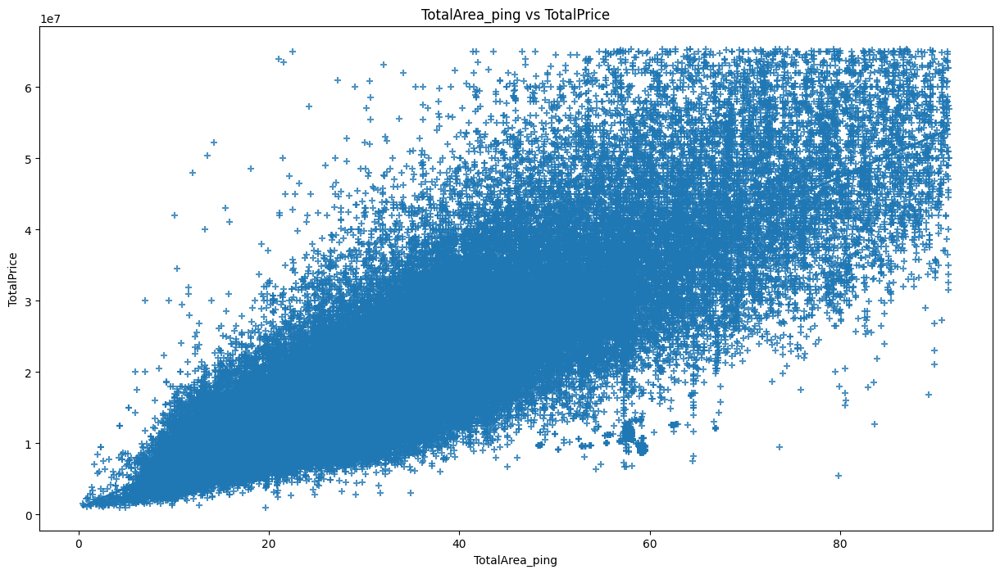

In [12]:
#Plot the correlation 
for feature in important_num.index: 
    plt.figure(figsize=(15,8))
    sns.regression.regplot(x = df_target[feature], y = df_target['TotalPrice'], marker='+')
    plt.title(feature + ' vs TotalPrice')

In [13]:
df_target = df_num
important_num = df_target.corr().loc['TotalPrice', (abs(df_target.corr()).TotalPrice > 0.2)& (df_target.corr().TotalPrice != 1)]
important_num.keys()
important_num

Num_ParkingSpace    0.511721
Storeys             0.315287
HouseAge           -0.309488
Bedrooms            0.370869
LivingRooms         0.319595
Bathrooms           0.353241
TotalArea           0.826590
LandArea            0.347350
PrimaryArea         0.645099
AuxiliaryArea       0.220874
ParkingArea         0.463983
BalconyArea         0.409425
UnitPrice_ping      0.396658
TotalArea_ping      0.826590
Name: TotalPrice, dtype: float64

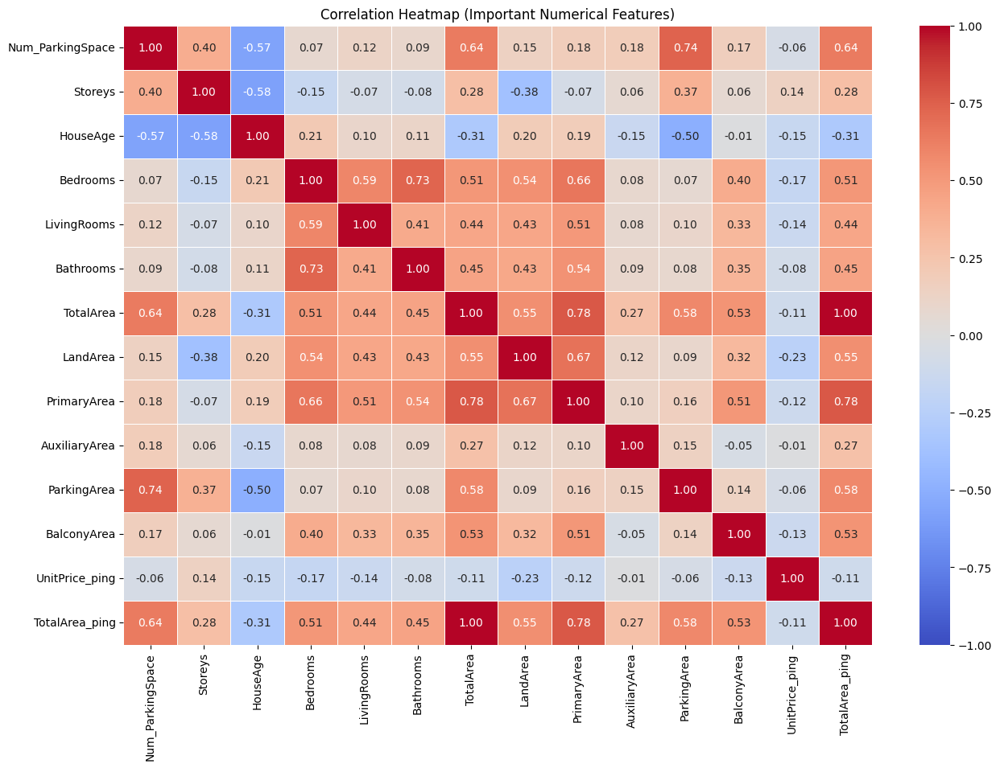

In [14]:
df_area = df[important_num.keys()]

# Calculate the correlation coefficient matrix
corr_matrix = df_area.corr()

# Determine the minimum and maximum absolute values within the masked data
min_val = abs(corr_matrix.values).min()
max_val = abs(corr_matrix.values).max()

# creat a heat map with the mask
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm', fmt=".2f", linewidths=.5, center=0, vmin=-max_val, vmax=max_val)

plt.title('Correlation Heatmap (Important Numerical Features)')
plt.show()

In [15]:
# See features have a correlation greater than 0.7 with the TotalArea
df_target = df_num.copy()
important_num = df_target.corr().loc['TotalArea', (abs(df_target.corr()).TotalArea > 0.52)& (df_target.corr().TotalArea != 1)]
important_num

Num_ParkingSpace    0.637337
LandArea            0.546947
PrimaryArea         0.776412
ParkingArea         0.580712
BalconyArea         0.528712
TotalPrice          0.826590
TotalArea_ping      1.000000
Name: TotalArea, dtype: float64

In [16]:
filtered_important_num = {key: value for key, value in important_num.items() if key != 'TotalPrice'}
filtered_important_num.keys()

dict_keys(['Num_ParkingSpace', 'LandArea', 'PrimaryArea', 'ParkingArea', 'BalconyArea', 'TotalArea_ping'])

In [17]:
df_target.drop(columns=filtered_important_num.keys(), axis=1, inplace=True)

In [18]:
important_num = df_target.corr().loc['TotalPrice', (abs(df_target.corr()).TotalPrice > 0.2)& (df_target.corr().TotalPrice != 1)]
important_num.keys()
important_num

Storeys           0.315287
HouseAge         -0.309488
Bedrooms          0.370869
LivingRooms       0.319595
Bathrooms         0.353241
TotalArea         0.826590
AuxiliaryArea     0.220874
UnitPrice_ping    0.396658
Name: TotalPrice, dtype: float64

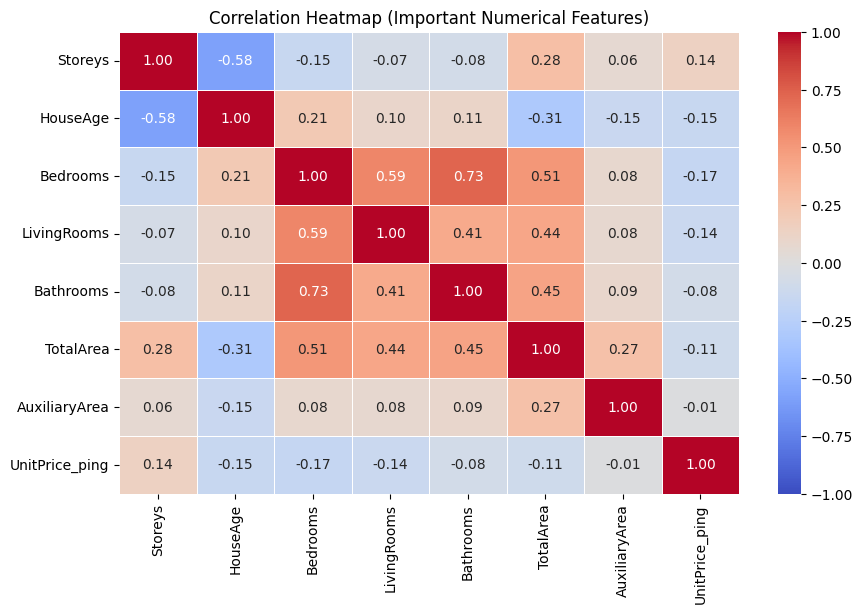

In [19]:
df_area = df[important_num.keys()]

# Calculate the correlation coefficient matrix
corr_matrix = df_area.corr()

# Determine the minimum and maximum absolute values within the masked data
min_val = abs(corr_matrix.values).min()
max_val = abs(corr_matrix.values).max()

# creat a heat map with the mask
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm', fmt=".2f", linewidths=.5, center=0, vmin=-max_val, vmax=max_val)

plt.title('Correlation Heatmap (Important Numerical Features)')
plt.show()

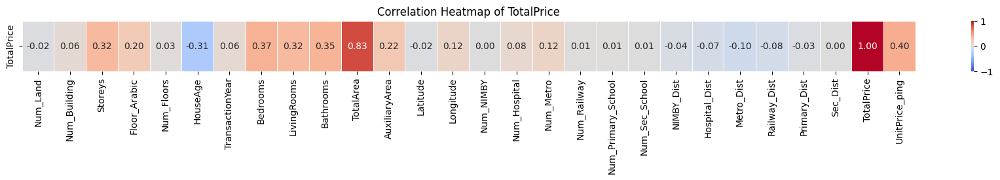

In [20]:
pa.one_column_heatmap(df_target, 'TotalPrice')

# HouseAge

In [21]:
# See features have a correlation greater than 0.6 with the HouseAge
important_num = df_target.corr().loc['HouseAge', (abs(df_target.corr()).HouseAge > 0.6)& (df_target.corr().HouseAge != 1)]
important_num

Series([], Name: HouseAge, dtype: float64)

In [22]:
df_target.drop(columns=important_num.keys(), axis=1, inplace=True)

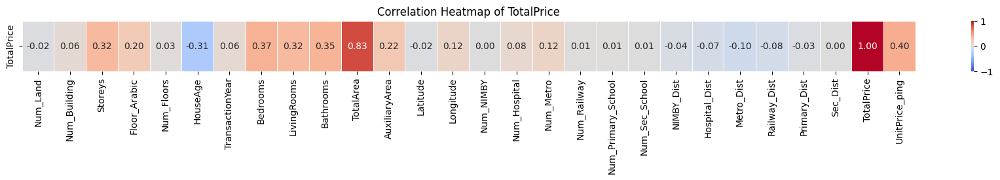

In [23]:
pa.one_column_heatmap(df_target, 'TotalPrice')

# Bedrooms

In [24]:
# See features have a correlation greater than 0.6 with the Bedrooms
important_num = df_target.corr().loc['Bedrooms', (abs(df_target.corr()).Bedrooms > 0.5)& (df_target.corr().Bedrooms != 1)]
important_num

LivingRooms    0.588046
Bathrooms      0.734039
TotalArea      0.512772
Name: Bedrooms, dtype: float64

In [25]:
columns = ['TotalPrice', 'TotalArea']
important_num = {key: value for key, value in important_num.items() if key not in columns}
important_num.keys()

dict_keys(['LivingRooms', 'Bathrooms'])

In [26]:
df_target.drop(columns=important_num.keys(), axis=1, inplace=True)

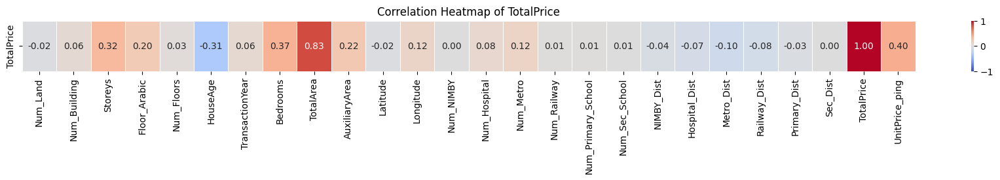

In [27]:
pa.one_column_heatmap(df_target, 'TotalPrice')

In [28]:
#df_target['Floor_Ratio'] = df_target['Floor_Arabic'] / df_target['Storeys']

<Axes: xlabel='Floor_Arabic', ylabel='TotalPrice'>

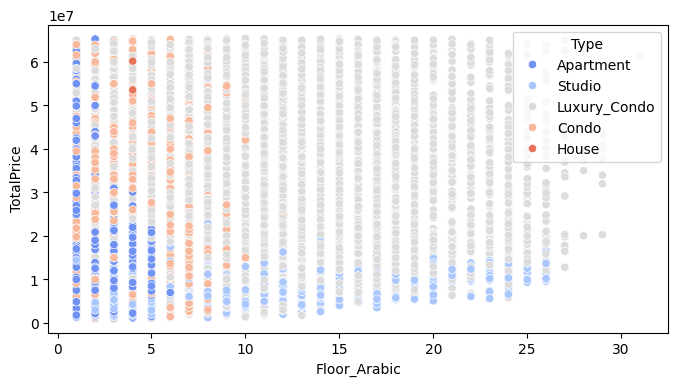

In [29]:
# 換算成 unitprice
plt.figure(figsize=(8,4))
sns.scatterplot(x='Floor_Arabic', y='TotalPrice', data=df, hue='Type', palette='coolwarm')

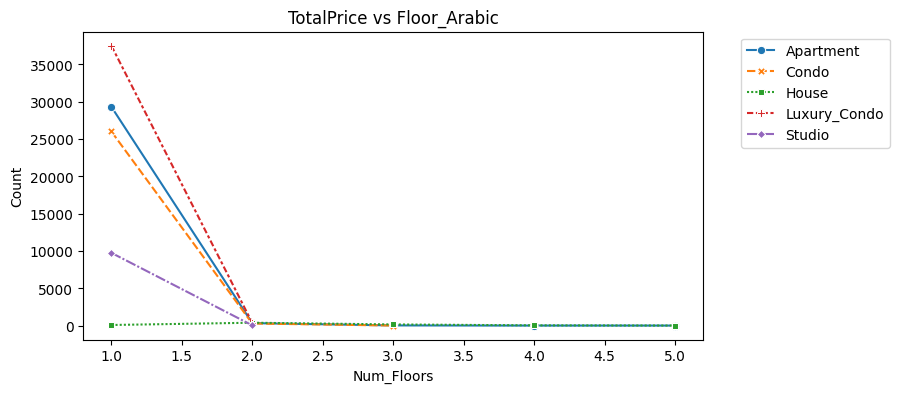

In [30]:
# Type 各年的交易量 (line plot)
plt.figure(figsize=(8, 4))
data = df.groupby(['Num_Floors', 'Type']).size().reset_index(name='Count')
sns.lineplot(data=data, x='Num_Floors', y='Count', hue='Type', style='Type', markers=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('TotalPrice vs Floor_Arabic')
plt.show()

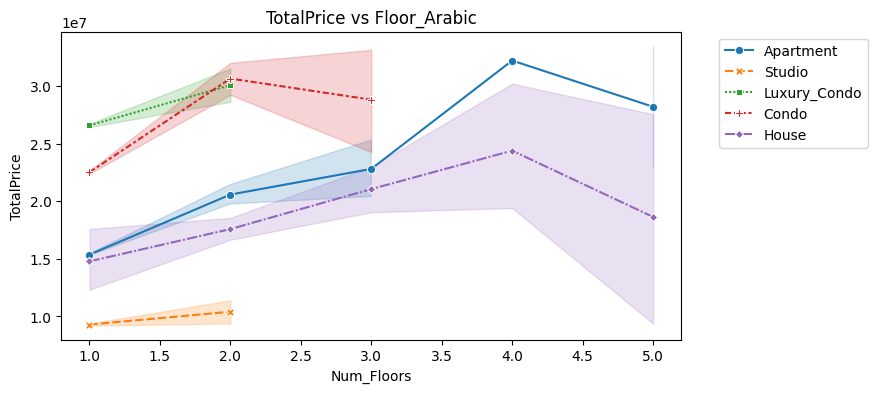

In [31]:
# Type 各年的交易量 (line plot)
plt.figure(figsize=(8, 4))
sns.lineplot(data=df, x='Num_Floors', y='TotalPrice', hue='Type', style='Type', markers=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('TotalPrice vs Floor_Arabic')
plt.show()

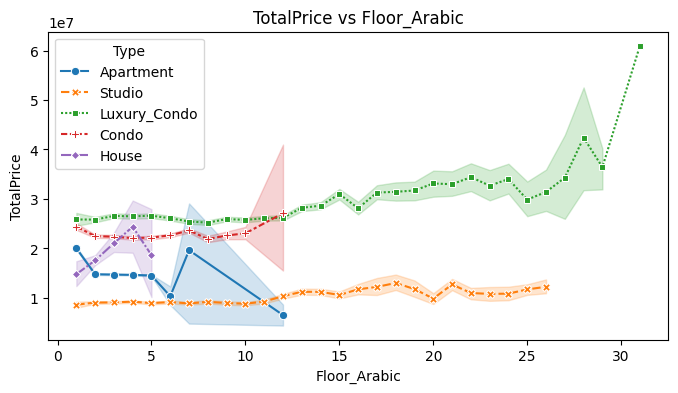

In [32]:
# District 各年的交易量 (line plot)
plt.figure(figsize=(8, 4))
sns.lineplot(data=df, x='Floor_Arabic', y='TotalPrice', hue='Type', style='Type', markers=True)
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('TotalPrice vs Floor_Arabic')
plt.show()

# Type

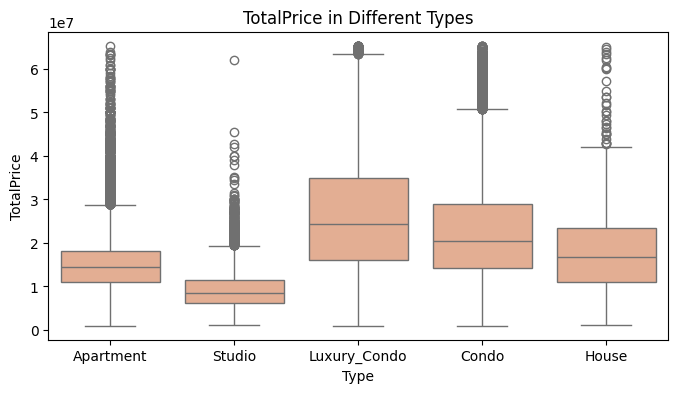

In [33]:
# Type 的 TatolPrice (box plot)
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x='Type', y='TotalPrice', color='#F0A986')
plt.title('TotalPrice in Different Types')
plt.show()

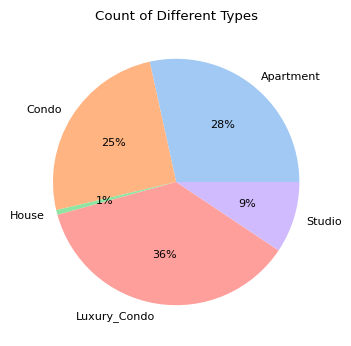

In [64]:
data_dict = {}
group = df.groupby('Type')
for name, datas in group:
    data_dict[name] = len(datas)
    
data_values = data_dict.values()
labels_values = data_dict.keys()

# Define pie chart
colors = sns.color_palette('pastel')
fig = plt.figure(figsize=(6,4))
plt.rcParams['font.size'] = 8

# Pie chart for total values
plt.pie(data_values, labels = labels_values, colors = colors, autopct='%.0f%%', radius=1)
plt.title('Count of Different Types')
plt.show()

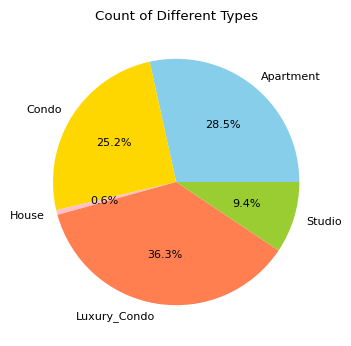

In [71]:
data_dict = {}
group = df.groupby('Type')
for name, datas in group:
    data_dict[name] = len(datas)

data_values = list(data_dict.values())
labels_values = list(data_dict.keys())

colors = {'Studio': 'yellowgreen', 'Apartment': 'skyblue', 'Condo': 'gold', 'Luxury_Condo': 'coral', 'House': 'pink'}

# Define pie chart
fig = plt.figure(figsize=(6, 4))
plt.rcParams['font.size'] = 8

# Pie chart for total values
plt.pie(data_values, labels=labels_values, autopct='%1.1f%%', radius=1, colors=[colors[label] for label in labels_values])
plt.title('Count of Different Types')
plt.show()



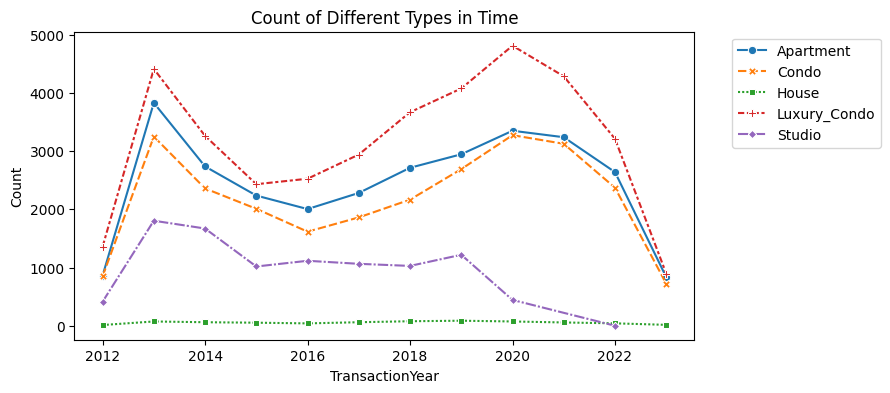

In [34]:
# Count of Different Types in Time
plt.figure(figsize=(8, 4))
data = df.groupby(['TransactionYear', 'Type']).size().reset_index(name='Count')
sns.lineplot(data=data, x='TransactionYear', y='Count', hue='Type', style='Type', markers=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Count of Different Types in Time')
plt.show()

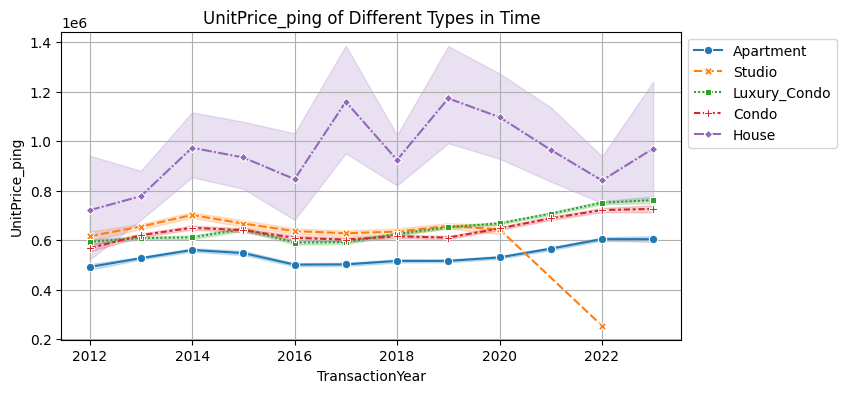

In [35]:
# UnitPrice_ping of Different Types in Time (line plot)
plt.figure(figsize=(8, 4))
sns.lineplot(data=df, x='TransactionYear', y='UnitPrice_ping', hue='Type', style='Type', markers=True)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('UnitPrice_ping of Different Types in Time')
plt.grid(True)
plt.show()

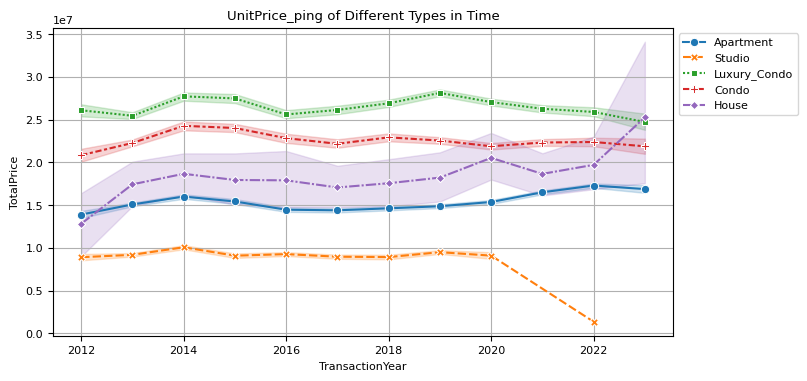

In [89]:
# UnitPrice_ping of Different Types in Time (line plot)
plt.figure(figsize=(8, 4))
sns.lineplot(data=df, x='TransactionYear', y='TotalPrice', hue='Type', style='Type', markers=True)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('TotalPrice of Different Types in Time')
plt.grid(True)
plt.show()

# Material

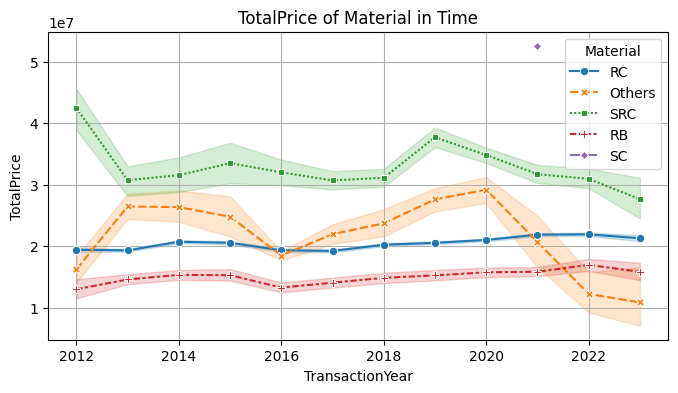

In [36]:
# TotalPrice of Material in Time
plt.figure(figsize=(8, 4))
sns.lineplot(data=df, x='TransactionYear', y='TotalPrice', hue='Material', style='Material', markers=True)
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('TotalPrice of Material in Time')
plt.grid(True)
plt.show()

# HouseAge

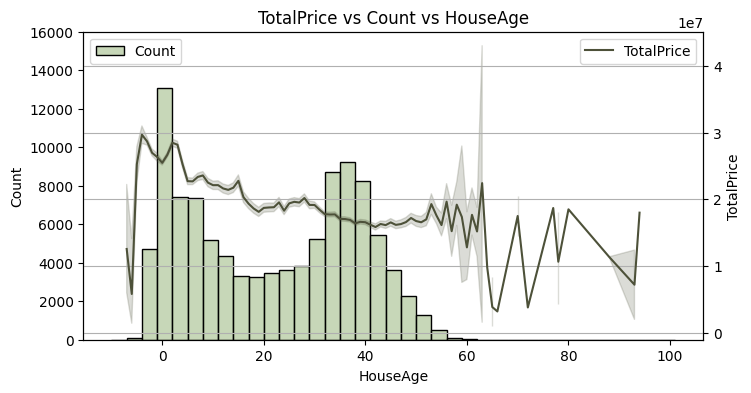

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# 創建一個 figure 和兩個 subplots（共享 x 軸）
fig, ax1 = plt.subplots(figsize=(8, 4))

# 繪製 Count 的條形圖（使用 ax=ax1 指定第一個 Y 軸），並設置標籤
sns.histplot(df['HouseAge'], color='#B5CAA0', bins=range(-10, 103, 3), ax=ax1, label='Count')
ax1.set_ylim(0, 16000)

# 創建第二個 Y 軸
ax2 = ax1.twinx()

# 繪製 TotalPrice 的折線圖，並設置標籤
sns.lineplot(data=df, x='HouseAge', y='TotalPrice', markers=True, label='TotalPrice', color='#4D5139', ax=ax2)

# 設置標籤和標題
ax1.set_xlabel('HouseAge')
ax1.set_ylabel('Count')
ax2.set_ylabel('TotalPrice')

# 添加圖例
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# 顯示圖形
plt.title('TotalPrice vs Count vs HouseAge')
plt.grid(True)
plt.show()


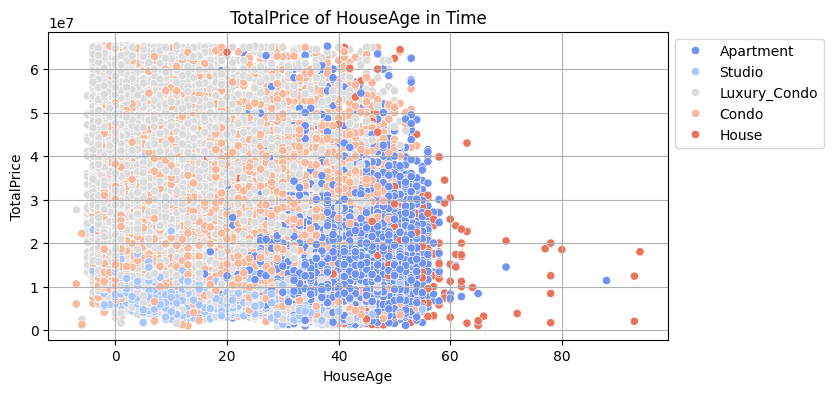

In [38]:
# Type 各年的交易量 (line plot)
plt.figure(figsize=(8, 4))
#sns.lineplot(data=df, x='HouseAge', y='TotalPrice', hue='Type', markers=True)
sns.scatterplot(x='HouseAge', y='TotalPrice', data=df, hue='Type', palette='coolwarm')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('TotalPrice of HouseAge in Time')
plt.grid(True)
plt.show()

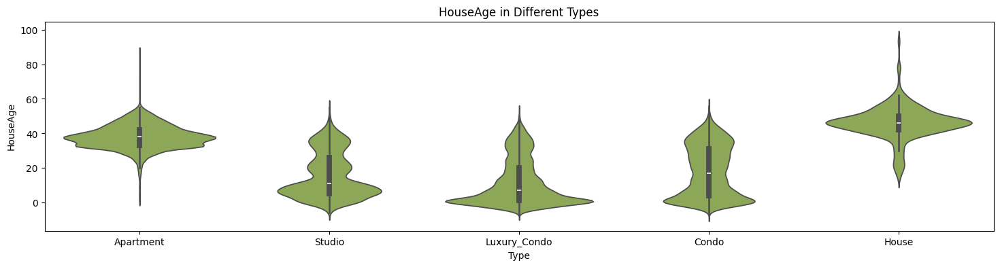

In [39]:
# HouseAge in Different Types
plt.figure(figsize=(18,4))
sns.violinplot(data=df,x='Type',y='HouseAge', color='#90B44B')
plt.title('HouseAge in Different Types')
plt.show()

In [ ]:
# UnitPrice_ping of Different Types in Time (line plot)
plt.figure(figsize=(8, 4))
sns.lineplot(data=df, x='CompletionYear', y='TotalPrice', hue='Type', style='Type', markers=True)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('UnitPrice_ping of Different Types in Time')
plt.grid(True)
plt.show()

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 104260 entries, 0 to 104260
Data columns (total 50 columns):
 #   Column              Non-Null Count   Dtype   
---  ------              --------------   -----   
 0   Identifier          104260 non-null  object  
 1   Num_Land            104260 non-null  int64   
 2   Num_Building        104260 non-null  int64   
 3   Num_ParkingSpace    104260 non-null  int64   
 4   Storeys             104260 non-null  float64 
 5   Floor_Arabic        104260 non-null  float64 
 6   Num_Floors          104260 non-null  float64 
 7   HouseAge            104260 non-null  int64   
 8   TransactionYear     104260 non-null  int64   
 9   Bedrooms            104260 non-null  int64   
 10  LivingRooms         104260 non-null  int64   
 11  Bathrooms           104260 non-null  int64   
 12  TotalArea           104260 non-null  float64 
 13  LandArea            104260 non-null  float64 
 14  PrimaryArea         104260 non-null  float64 
 15  AuxiliaryArea       10

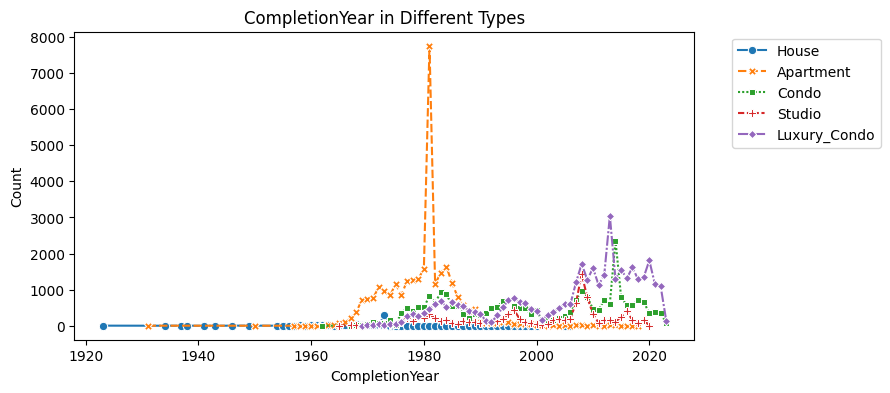

In [7]:
# Count of Different Types in Time
plt.figure(figsize=(8, 4))
data = df.groupby(['CompletionYear', 'Type']).size().reset_index(name='Count')
sns.lineplot(data=data, x='CompletionYear', y='Count', hue='Type', style='Type', markers=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('CompletionYear in Different Types')
plt.show()

# test

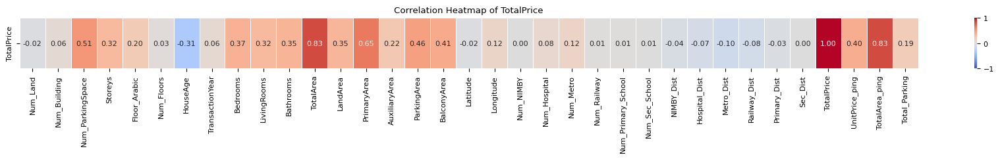

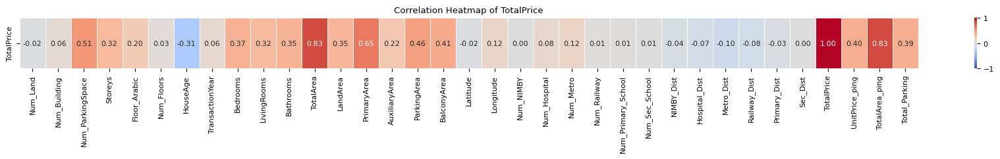

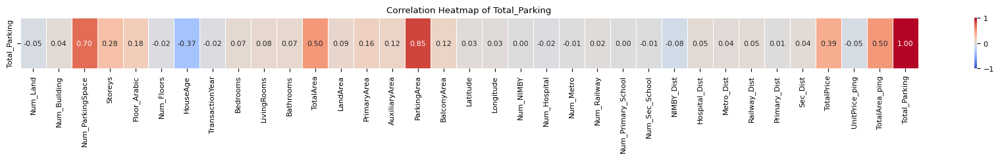

In [84]:
pa.one_column_heatmap(df, 'TotalPrice')
df['Total_Parking'] = df['ParkingArea']*df['Num_ParkingSpace']
pa.one_column_heatmap(df, 'TotalPrice')
pa.one_column_heatmap(df, 'Total_Parking')

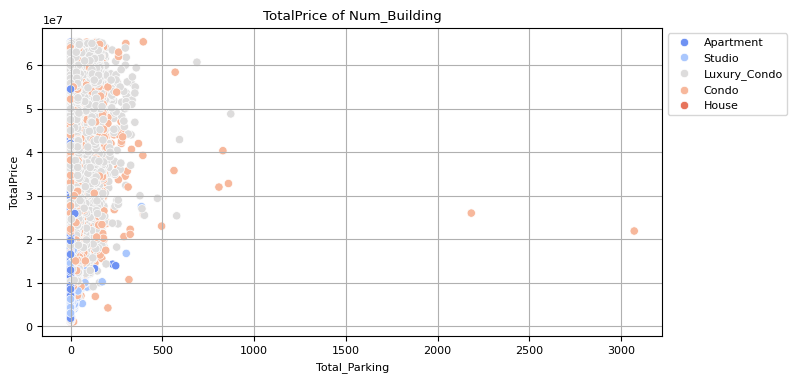

In [85]:

# Type 各年的交易量 (line plot)
plt.figure(figsize=(8, 4))
#sns.lineplot(data=df, x='HouseAge', y='TotalPrice', hue='Type', markers=True)
sns.scatterplot(x='Total_Parking', y='TotalPrice', data=df, hue='Type', palette='coolwarm')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('TotalPrice of Num_Building')
plt.grid(True)
plt.show()

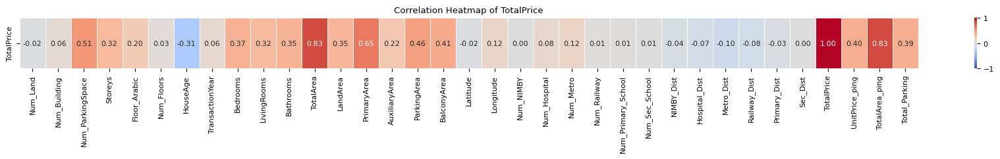

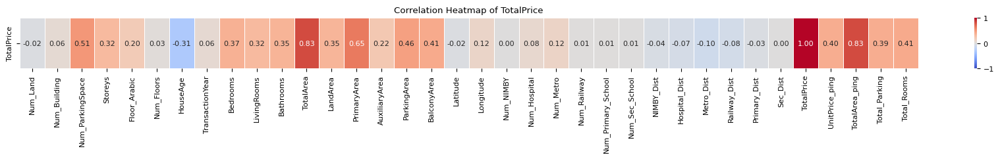

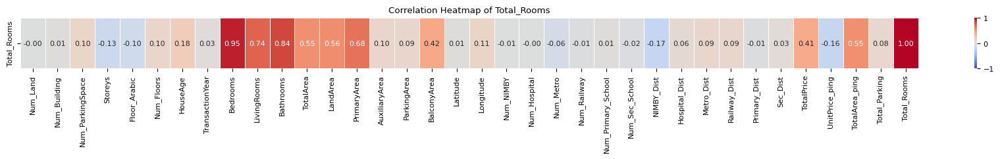

In [87]:
pa.one_column_heatmap(df, 'TotalPrice')
df['Total_Rooms'] = df['Bedrooms'] + df['Bathrooms'] + df['LivingRooms']
pa.one_column_heatmap(df, 'TotalPrice')
pa.one_column_heatmap(df, 'Total_Rooms')

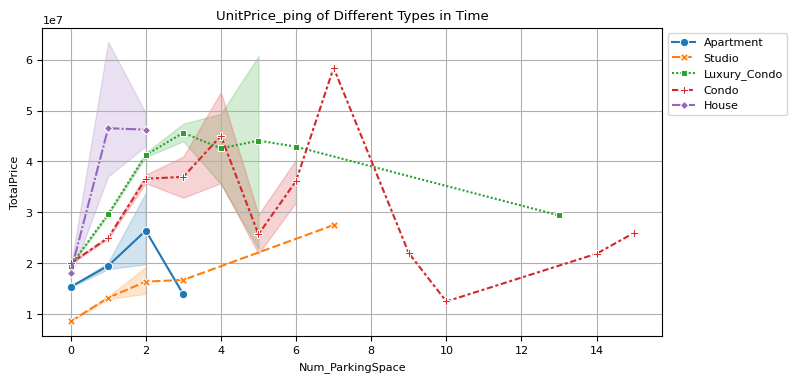

In [75]:
# UnitPrice_ping of Different Types in Time (line plot)
plt.figure(figsize=(8, 4))
sns.lineplot(data=df, x='Num_ParkingSpace', y='TotalPrice', hue='Type', style='Type', markers=True)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('UnitPrice_ping of Different Types in Time')
plt.grid(True)
plt.show()

# All

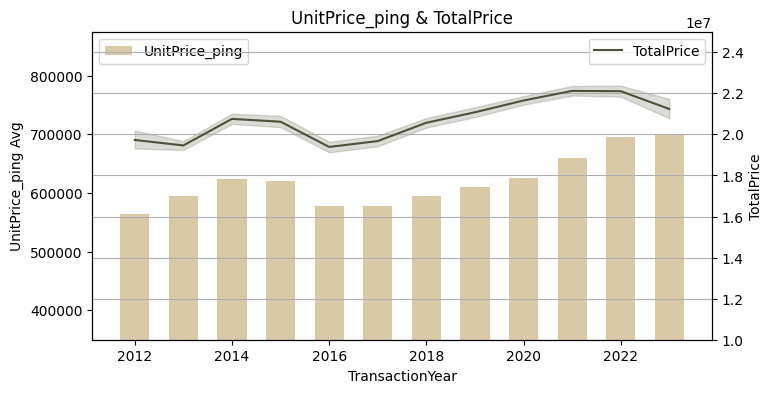

In [90]:
# Create a figure with two subplots sharing the x-axis
fig, ax1 = plt.subplots(figsize=(8, 4))

# Create the second y-axis (ax2)
ax2 = ax1.twinx()

# Plot the bar chart for 'UnitPrice_ping' on the second y-axis and set the label
total_price_avg = df.groupby('TransactionYear')['UnitPrice_ping'].mean()
ax1.bar(total_price_avg.index, total_price_avg.values, color='#DAC9A6', label='UnitPrice_ping', width=0.6)
ax1.set_ylim(350000, 875000)

# Plot the line chart for 'TotalPrice' on the second y-axis and set the label
sns.lineplot(data=df, x='TransactionYear', y='TotalPrice', markers=True, label='TotalPrice', color='#4D5139', ax=ax2)
ax2.set_ylim(10000000, 25000000)

# Set labels and titles
ax1.set_xlabel('TransactionYear')
ax1.set_ylabel('UnitPrice_ping Avg')
ax2.set_ylabel('TotalPrice')

# Show legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.title('UnitPrice_ping & TotalPrice')
plt.grid(True)
plt.show()




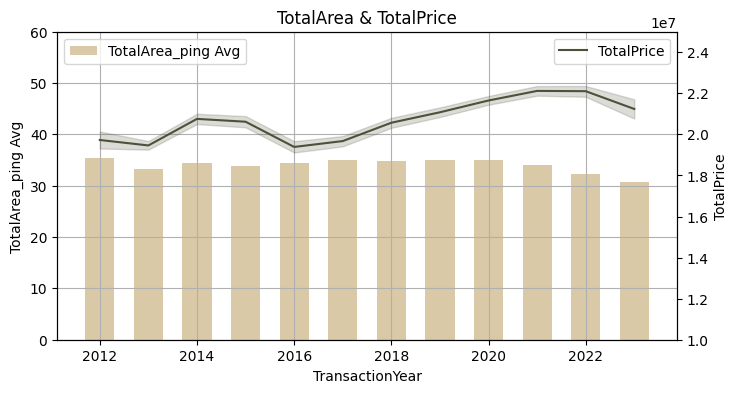

In [103]:
# Create a figure with two subplots sharing the x-axis
fig, ax1 = plt.subplots(figsize=(8, 4))


# Plot the bar chart for 'UnitPrice_ping' on the second y-axis and set the label
total_price_avg = df.groupby('TransactionYear')['TotalArea_ping'].mean()
ax1.bar(total_price_avg.index, total_price_avg.values, color='#DAC9A6', label='TotalArea_ping Avg', width=0.6)
ax1.set_ylim(0, 60)
plt.grid(True)

# Create the second y-axis (ax2)
ax2 = ax1.twinx()

# Plot the line chart for 'TotalPrice' on the second y-axis and set the label
sns.lineplot(data=df, x='TransactionYear', y='TotalPrice', markers=True, label='TotalPrice', color='#4D5139', ax=ax2)
ax2.set_ylim(10000000, 25000000)

# Set labels and titles
ax1.set_xlabel('TransactionYear')
ax1.set_ylabel('TotalArea_ping Avg')
ax2.set_ylabel('TotalPrice')

# Show legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.title('TotalArea & TotalPrice')

plt.show()


In [104]:
df['TotalPrice'].describe()

count    1.042600e+05
mean     2.074128e+07
std      1.225707e+07
min      1.000000e+06
25%      1.200000e+07
50%      1.754200e+07
75%      2.680000e+07
max      6.538000e+07
Name: TotalPrice, dtype: float64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


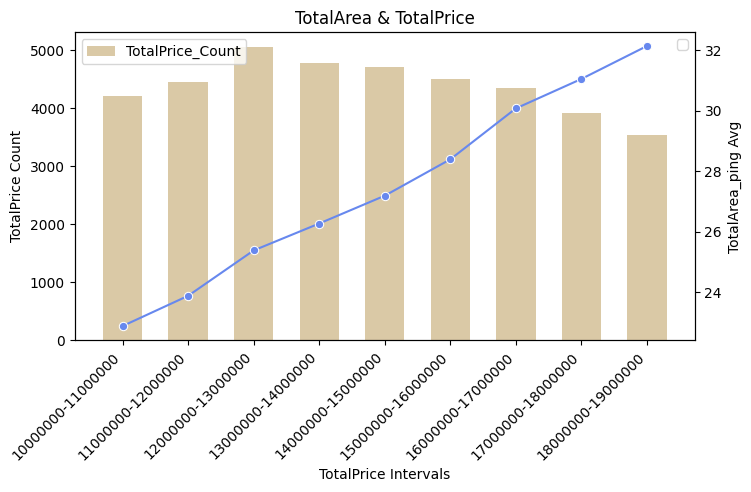

In [140]:
# Set the color palette
sns.set_palette('coolwarm')

# Create a figure with two subplots sharing the x-axis
fig, ax1 = plt.subplots(figsize=(8, 4))

# Bin TotalPrice and calculate TotalPrice Count and TotalArea_avg
bins = np.arange(10000000, 20000000, 1000000)
group_tprice = pd.cut(df["TotalPrice"], bins)
grouped_data = df.groupby(group_tprice)
total_price_count = grouped_data.size()
total_area_avg = grouped_data["TotalArea_ping"].mean()

# Plot TotalPrice Count as bar chart on the left y-axis (ax1)
ax1.bar(range(len(total_price_count)), total_price_count.values, color='#DAC9A6', label='TotalPrice_Count', width=0.6)

# Set x-ticks and labels for the bar chart
ax1.set_xticks(range(len(total_price_count)))
ax1.set_xticklabels([f'{edge.left}-{edge.right}' for edge in total_price_count.index], rotation=45, ha='right')

# Create the second y-axis (ax2)
ax2 = ax1.twinx()

# Plot TotalArea_avg as line chart on the right y-axis (ax2) with 'Type' as hue
sns.lineplot(x=range(len(total_price_count)), y=total_area_avg.values, marker='o', ax=ax2)

# Set labels and titles
ax1.set_xlabel('TotalPrice Intervals')
ax1.set_ylabel('TotalPrice Count')
ax2.set_ylabel('TotalArea_ping Avg')

# Show legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.title('TotalArea & TotalPrice')
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


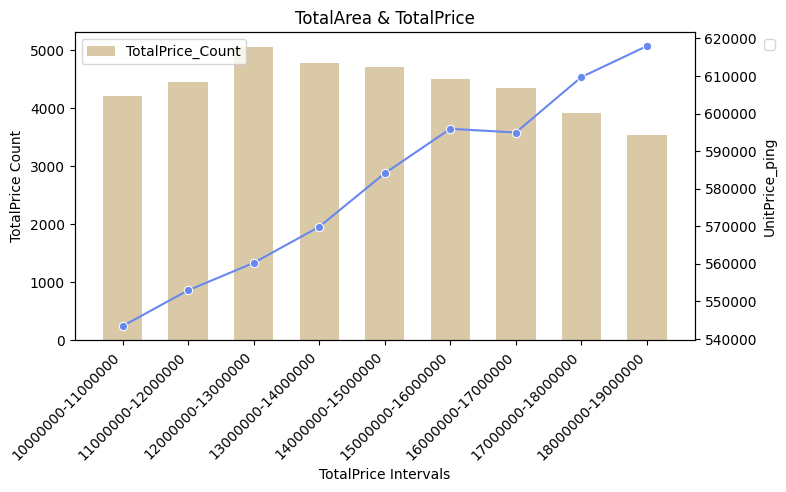

In [138]:
# Set the color palette
sns.set_palette('coolwarm')

# Create a figure with two subplots sharing the x-axis
fig, ax1 = plt.subplots(figsize=(8, 4))

# Bin TotalPrice and calculate TotalPrice Count and TotalArea_avg
bins = np.arange(10000000, 20000000, 1000000)
group_tprice = pd.cut(df["TotalPrice"], bins)
grouped_data = df.groupby(group_tprice)
total_price_count = grouped_data.size()
total_area_avg = grouped_data["UnitPrice_ping"].mean()

# Plot TotalPrice Count as bar chart on the left y-axis (ax1)
ax1.bar(range(len(total_price_count)), total_price_count.values, color='#DAC9A6', label='TotalPrice_Count', width=0.6)

# Set x-ticks and labels for the bar chart
ax1.set_xticks(range(len(total_price_count)))
ax1.set_xticklabels([f'{edge.left}-{edge.right}' for edge in total_price_count.index], rotation=45, ha='right')

# Create the second y-axis (ax2)
ax2 = ax1.twinx()

# Plot TotalArea_avg as line chart on the right y-axis (ax2) with 'Type' as hue
sns.lineplot(x=range(len(total_price_count)), y=total_area_avg.values, marker='o', ax=ax2)

# Set labels and titles
ax1.set_xlabel('TotalPrice Intervals')
ax1.set_ylabel('TotalPrice Count')
ax2.set_ylabel('UnitPrice_ping')

# Show legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.title('TotalArea & TotalPrice')
plt.legend(bbox_to_anchor=(1.1, 1), loc='upper left')
plt.show()



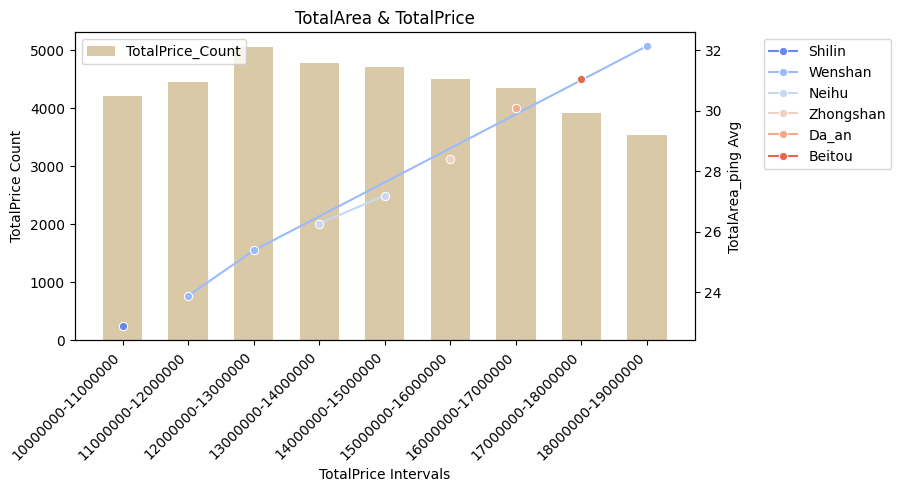

In [131]:
# Set the color palette
sns.set_palette('coolwarm')

# Create a figure with two subplots sharing the x-axis
fig, ax1 = plt.subplots(figsize=(8, 4))

# Bin TotalPrice and calculate TotalPrice Count and TotalArea_avg
bins = np.arange(10000000, 20000000, 1000000)
group_tprice = pd.cut(df["TotalPrice"], bins)
grouped_data = df.groupby(group_tprice)
total_price_count = grouped_data.size()
total_area_avg = grouped_data["TotalArea_ping"].mean()

# Plot TotalPrice Count as bar chart on the left y-axis (ax1)
ax1.bar(range(len(total_price_count)), total_price_count.values, color='#DAC9A6', label='TotalPrice_Count', width=0.6)

# Set x-ticks and labels for the bar chart
ax1.set_xticks(range(len(total_price_count)))
ax1.set_xticklabels([f'{edge.left}-{edge.right}' for edge in total_price_count.index], rotation=45, ha='right')

# Create the second y-axis (ax2)
ax2 = ax1.twinx()

# Plot TotalArea_avg as line chart on the right y-axis (ax2) with 'Type' as hue
sns.lineplot(x=range(len(total_price_count)), y=total_area_avg.values, marker='o', ax=ax2, hue=df.groupby(group_tprice)['District'].first())

# Set labels and titles
ax1.set_xlabel('TotalPrice Intervals')
ax1.set_ylabel('TotalPrice Count')
ax2.set_ylabel('TotalArea_ping Avg')

# Show legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.title('TotalArea & TotalPrice')
plt.legend(bbox_to_anchor=(1.1, 1), loc='upper left')
plt.show()


In [146]:
#Plot the correlation 
plt.figure(figsize=(15,8))
sns.regression.regplot(x = df['TotalPrice'], y = df['TotalArea_ping'], marker='+', hue='District', palette='coolwarm')
plt.title('TotalArea_ping vs TotalPrice')

TypeError: regplot() got an unexpected keyword argument 'hue'

<Figure size 1500x800 with 0 Axes>

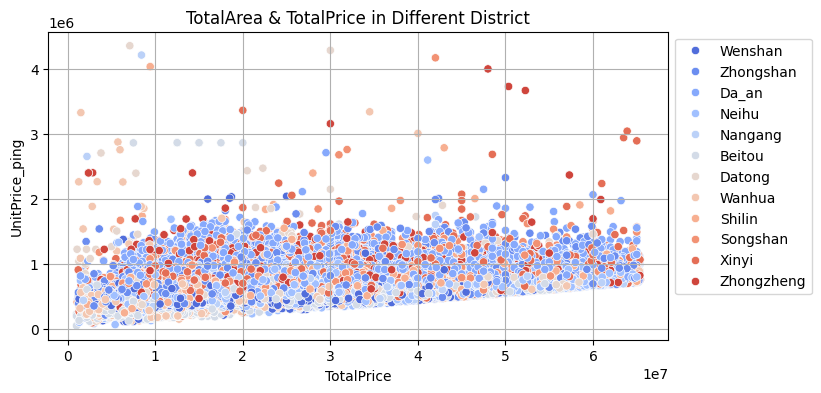

In [143]:
# Type 各年的交易量 (line plot)
plt.figure(figsize=(8, 4))
#sns.lineplot(data=df, x='HouseAge', y='TotalPrice', hue='Type', markers=True)
sns.scatterplot(x='TotalPrice', y='UnitPrice_ping', data=df, hue='District', palette='coolwarm')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('TotalArea & TotalPrice in Different District')
plt.grid(True)
plt.show()

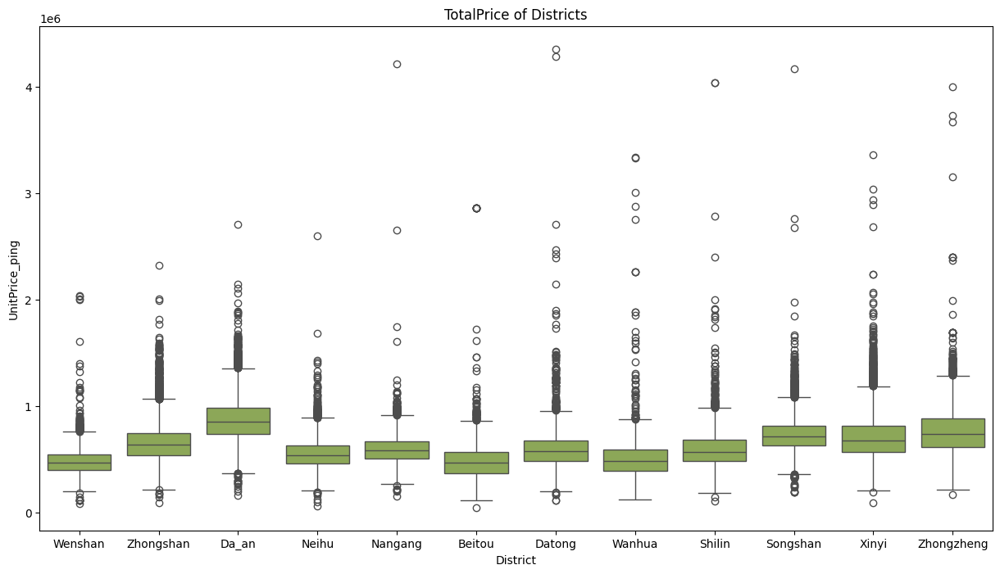

In [144]:
plt.figure(figsize=(15,8))
sns.boxplot(data=df, x='District', y='UnitPrice_ping', color='#90B44B')
plt.title('TotalPrice of Districts')
plt.show()

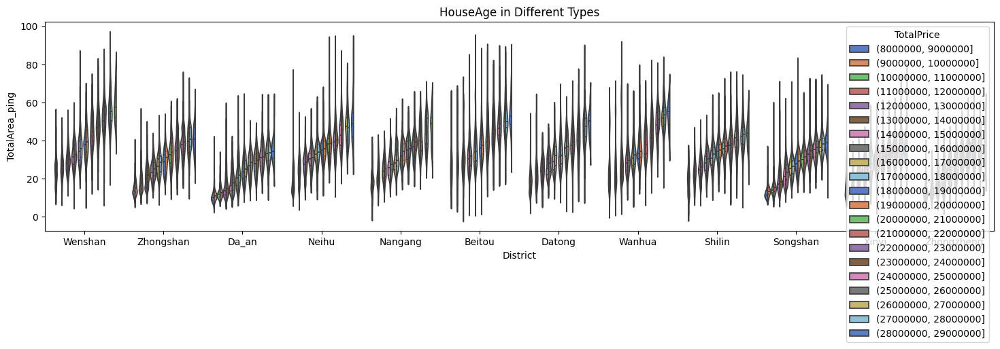

In [128]:
# Bin TotalPrice and calculate TotalPrice Count and TotalArea_avg
bins = np.arange(8000000, 30000000, 1000000)
group_tprice = pd.cut(df["TotalPrice"], bins)
grouped_data = df.groupby(group_tprice)
total_price_count = grouped_data.size()
total_area_avg = grouped_data["TotalArea_ping"].mean()

# Create a violin plot using Seaborn
plt.figure(figsize=(18, 4))
sns.violinplot(data=df, x='District', y='TotalArea_ping', hue=group_tprice, split=True, inner="quart", palette="muted")
plt.title('HouseAge in Different Types')
plt.show()


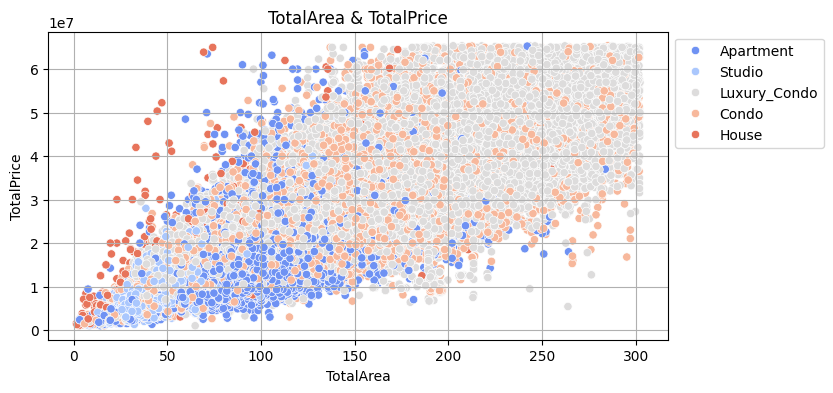

In [126]:
# Type 各年的交易量 (line plot)
plt.figure(figsize=(8, 4))
#sns.lineplot(data=df, x='HouseAge', y='TotalPrice', hue='Type', markers=True)
sns.scatterplot(x='TotalArea', y='TotalPrice', data=df, hue='Type', palette='coolwarm')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('TotalArea & TotalPrice')
plt.grid(True)
plt.show()

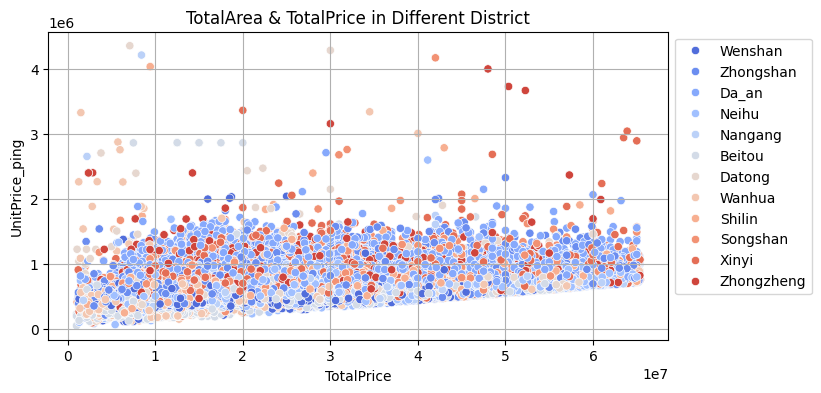

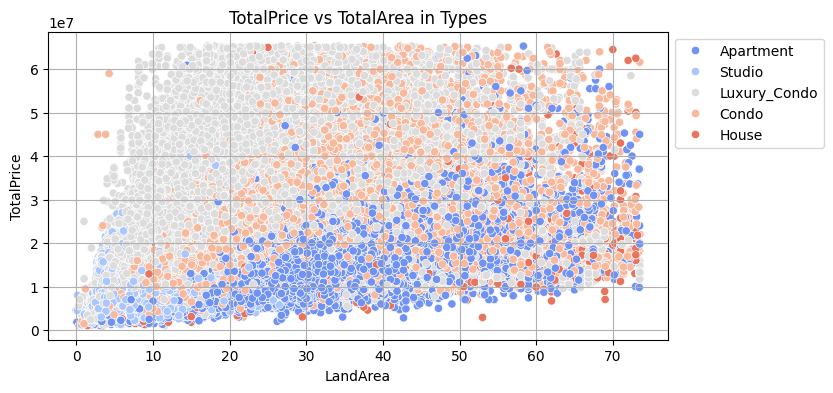

In [42]:
# Type 各年的交易量 (line plot)
plt.figure(figsize=(8, 4))
#sns.lineplot(data=df, x='HouseAge', y='TotalPrice', hue='Type', markers=True)
sns.scatterplot(x='LandArea', y='TotalPrice', data=df, hue='Type', palette='coolwarm')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('TotalPrice vs TotalArea in Types')
plt.grid(True)
plt.show()

In [43]:
print(len(df[(df['UnitPrice_ping'] > 5000000)]))
print(f'row_count: {len(df)}')
df = df[(df['UnitPrice_ping'] < 5000000)]
print(f'row_count: {len(df)}')

0
row_count: 104260
row_count: 104260


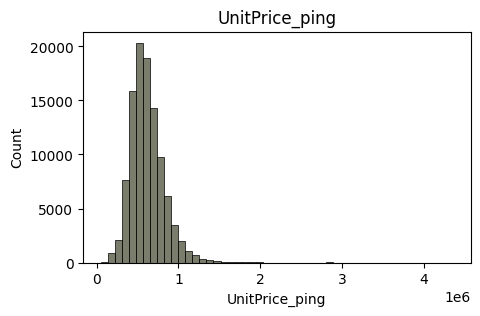

In [44]:
# 查看 UnitPrice_ping 資料分布情況
plt.figure(figsize=(5, 3))
plt.title('UnitPrice_ping')
sns.histplot(df['UnitPrice_ping'], color='#4D5139', bins=50)
plt.show()

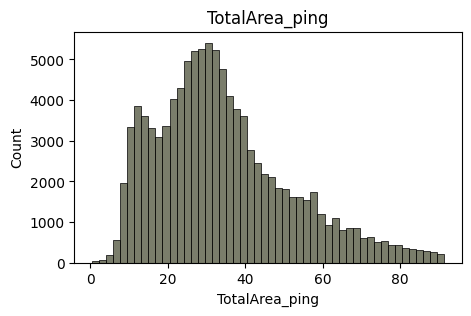

In [45]:
# 查看 'TotalArea_ping 資料分布情況
plt.figure(figsize=(5, 3))
plt.title('TotalArea_ping')
sns.histplot(df['TotalArea_ping'], color='#4D5139', bins=50)
plt.show()

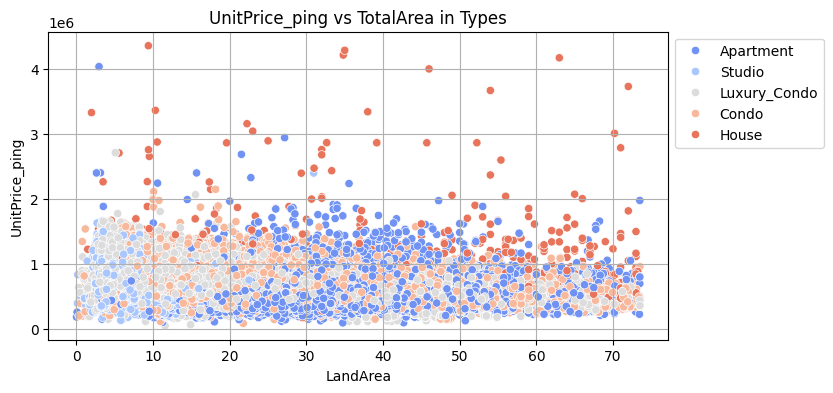

In [46]:
# UnitPrice_ping
plt.figure(figsize=(8, 4))
#sns.lineplot(data=df, x='HouseAge', y='TotalPrice', hue='Type', markers=True)
sns.scatterplot(x='LandArea', y='UnitPrice_ping', data=df, hue='Type', palette='coolwarm')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('UnitPrice_ping vs TotalArea in Types')
plt.grid(True)
plt.show()

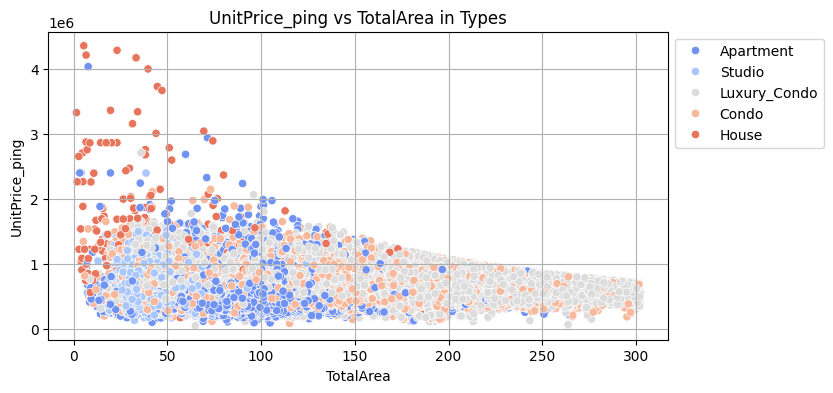

In [47]:
# UnitPrice_ping
plt.figure(figsize=(8, 4))
#sns.lineplot(data=df, x='HouseAge', y='TotalPrice', hue='Type', markers=True)
sns.scatterplot(x='TotalArea', y='UnitPrice_ping', data=df, hue='Type', palette='coolwarm')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('UnitPrice_ping vs TotalArea in Types')
plt.grid(True)
plt.show()

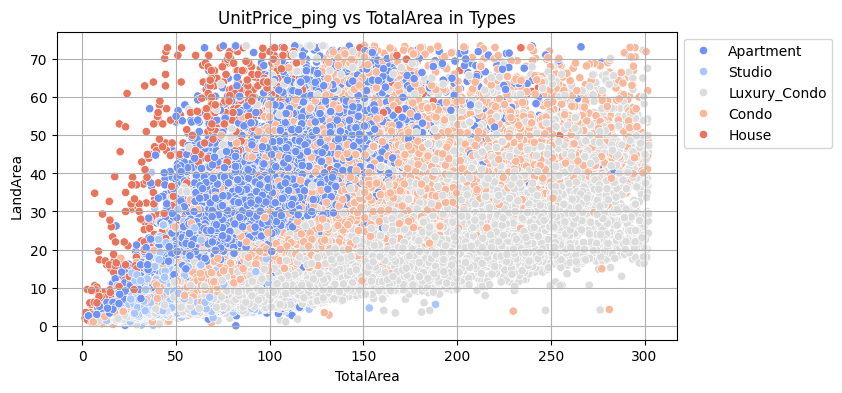

In [48]:
# UnitPrice_ping
plt.figure(figsize=(8, 4))
#sns.lineplot(data=df, x='HouseAge', y='TotalPrice', hue='Type', markers=True)
sns.scatterplot(x='TotalArea', y='LandArea', data=df, hue='Type', palette='coolwarm')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('UnitPrice_ping vs TotalArea in Types')
plt.grid(True)
plt.show()

In [50]:
df['UnitPrice_ping'].describe()

count    1.042600e+05
mean     6.182907e+05
std      2.081652e+05
min      5.094444e+04
25%      4.794127e+05
50%      5.905067e+05
75%      7.265061e+05
max      4.356508e+06
Name: UnitPrice_ping, dtype: float64

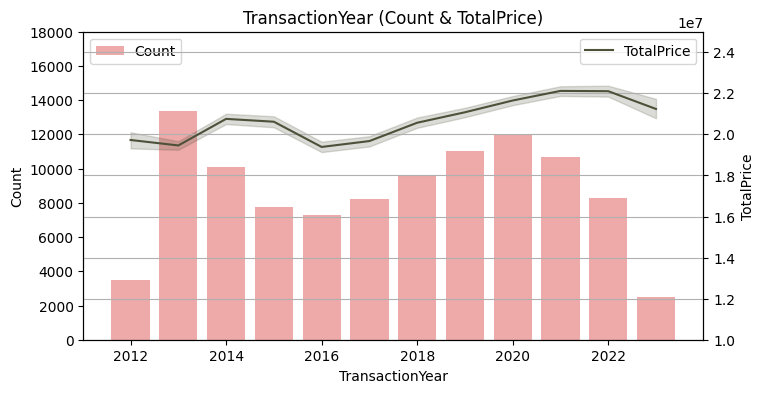

In [51]:
# 創建一個 figure 和兩個 subplots（共享 x 軸）
fig, ax1 = plt.subplots(figsize=(8, 4))

# 繪製 Count 的柱狀圖（使用 ax=ax1 指定第一個 Y 軸），並設置標籤
year_counts = df['TransactionYear'].value_counts().sort_index()
years = year_counts.index
counts = year_counts.values
ax1.bar(years, counts, color='#EEA9A9', label='Count')
ax1.set_ylim(0, 18000)

# 創建第二個 Y 軸
ax2 = ax1.twinx()

# 繪製 TotalPrice 的折線圖，並設置標籤
sns.lineplot(data=df, x='TransactionYear', y='TotalPrice', markers=True, label='TotalPrice', color='#4D5139', ax=ax2)
ax2.set_ylim(10000000, 25000000)

# 設置標籤和標題
ax1.set_xlabel('TransactionYear')
ax1.set_ylabel('Count')
ax2.set_ylabel('TotalPrice')

# 顯示圖例
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# 顯示圖形
plt.title('TransactionYear (Count & TotalPrice)')
plt.grid(True)
plt.show()



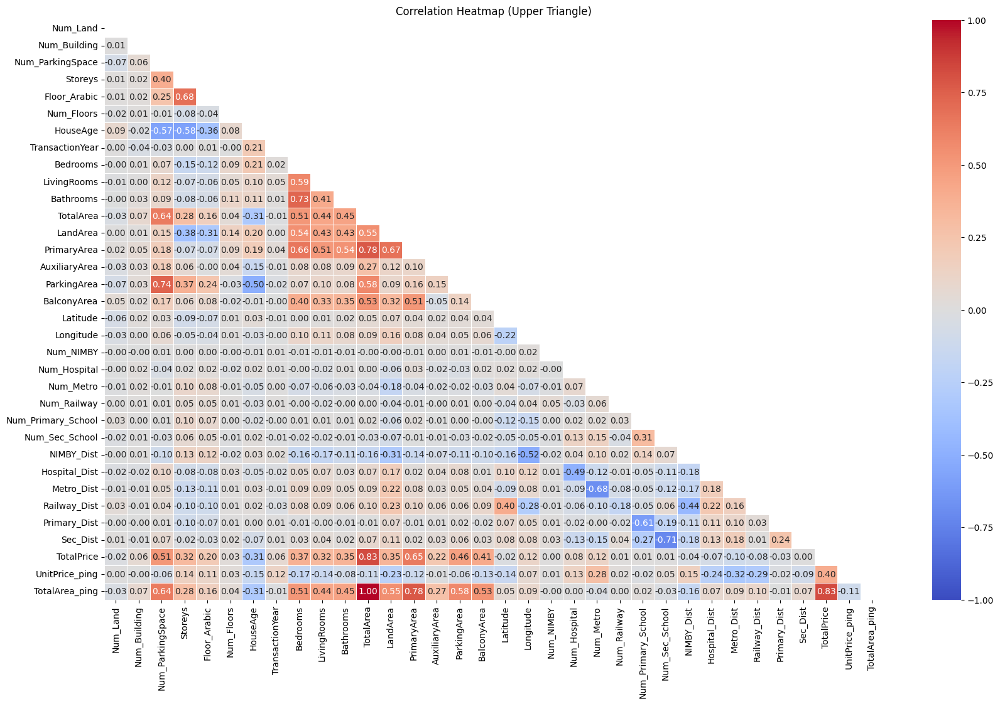

In [52]:
# Calculate the correlation coefficient matrix
pa.all_corr_heatmap(df)

# 9-2. Classification Data

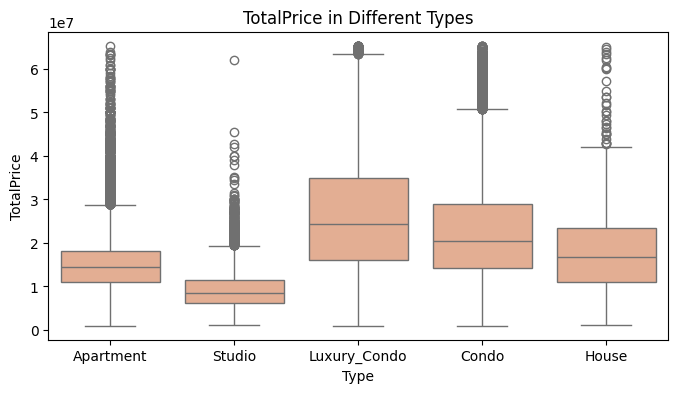

In [53]:
# Type 的 TatolPrice (box plot)
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x='Type', y='TotalPrice', color='#F0A986')
plt.title('TotalPrice in Different Types')
plt.show()

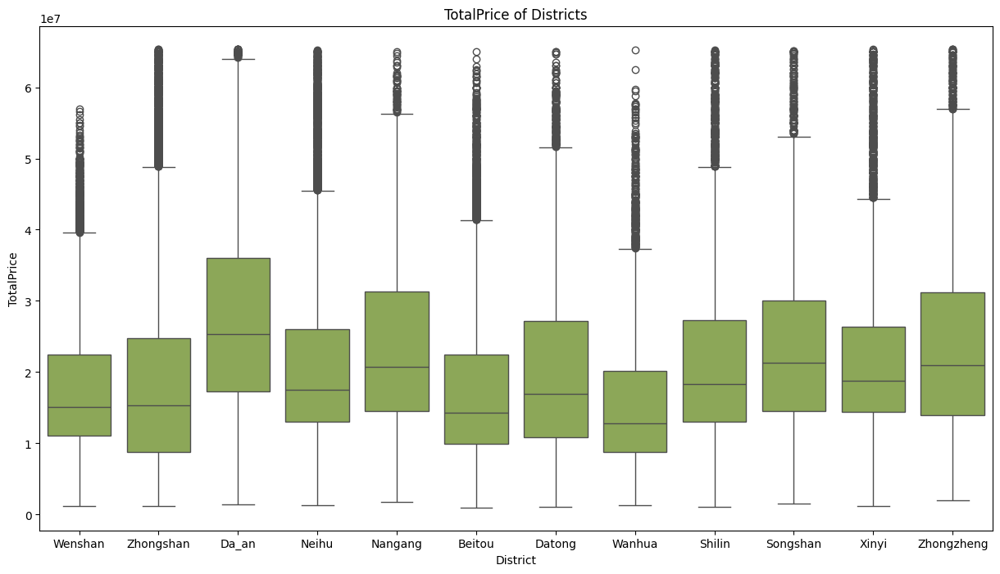

In [7]:
plt.figure(figsize=(15,8))
sns.boxplot(data=df, x='District', y='TotalPrice', color='#90B44B')
plt.title('TotalPrice of Districts')
plt.show()

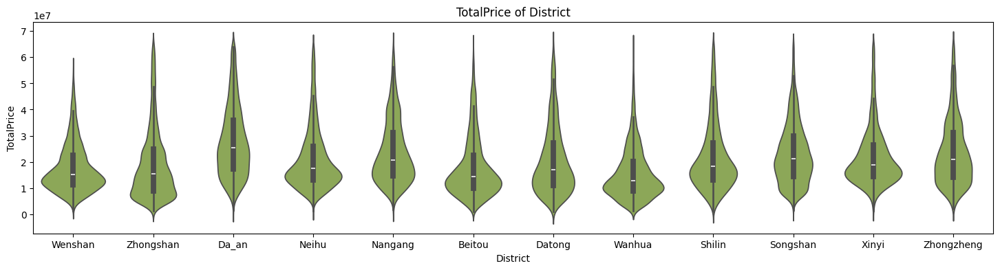

In [8]:

plt.figure(figsize=(18,4))
sns.violinplot(data=df,x='District',y='TotalPrice', color='#90B44B')
plt.title('TotalPrice of District')
plt.show()

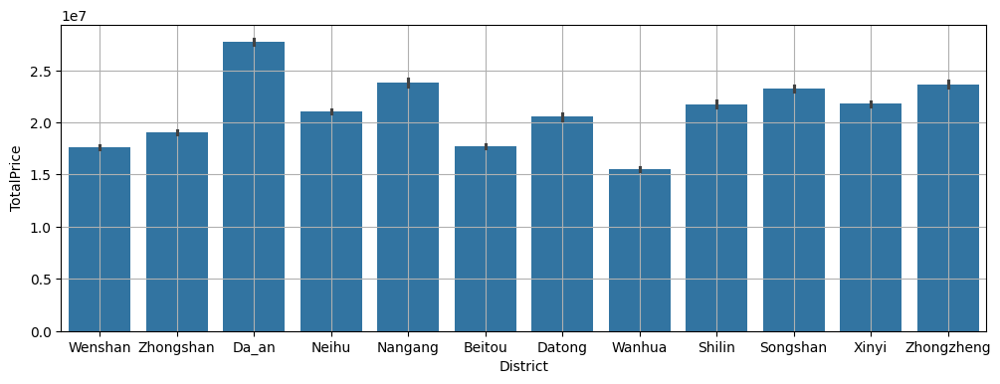

In [32]:
plt.figure(figsize=(12,4))
sns.barplot(df, x="District", y="TotalPrice")
#ax1.bar(years, counts, color='#EEA9A9', label='Count')
plt.grid(True)

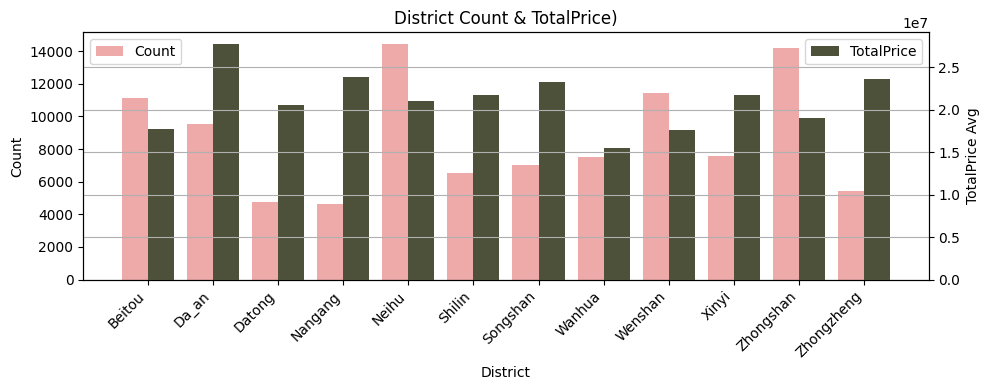

In [52]:
# Create a figure with two subplots sharing the x-axis
fig, ax1 = plt.subplots(figsize=(10, 4))

# Draw the bar chart for 'Count' on the first y-axis (ax1) and set the label
dist_counts = df['District'].value_counts().sort_index()
dist = dist_counts.index
counts = dist_counts.values
bar_width = 0.4

ax1.bar(dist, counts, color='#EEA9A9', label='Count', width=bar_width)

# Calculate x-coordinates for the second y-axis (ax2) to slightly offset the bars
dist_shifted = np.arange(len(dist))

# Create the second y-axis (ax2)
ax2 = ax1.twinx()

# Draw the bar chart for 'TotalPrice Avg' on the second y-axis and set the label
total_price_avg = df.groupby('District')['TotalPrice'].mean()
ax2.bar(dist_shifted + bar_width, total_price_avg, color='#4D5139', label='TotalPrice', width=bar_width)

# Set labels and titles
ax1.set_xlabel('District')
ax1.set_ylabel('Count')
ax2.set_ylabel('TotalPrice Avg')

# Set x-axis ticks and labels
combined_shifted = dist_shifted + bar_width / 2
ax1.set_xticks(combined_shifted)
ax1.set_xticklabels(dist, rotation=45, ha="right")

# Show legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.title('District Count & TotalPrice)')
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
# Create a figure with two subplots sharing the x-axis
fig, ax1 = plt.subplots(figsize=(10, 4))

# Draw the bar chart for 'Count' on the first y-axis (ax1) and set the label
dist_counts = df['District'].value_counts().sort_index()
dist = dist_counts.index
counts = dist_counts.values
bar_width = 0.4

ax1.bar(dist, counts, color='#EEA9A9', label='Count', width=bar_width)

# Calculate x-coordinates for the second y-axis (ax2) to slightly offset the bars
dist_shifted = np.arange(len(dist))

# Create the second y-axis (ax2)
ax2 = ax1.twinx()

# Draw the bar chart for 'TotalPrice Avg' on the second y-axis and set the label
total_price_avg = df.groupby('District')['TotalPrice'].mean()
ax2.bar(dist_shifted + bar_width, total_price_avg, color='#4D5139', label='TotalPrice', width=bar_width)

# Set labels and titles
ax1.set_xlabel('District')
ax1.set_ylabel('Count')
ax2.set_ylabel('TotalPrice Avg')

# Set x-axis ticks and labels
combined_shifted = dist_shifted + bar_width / 2
ax1.set_xticks(combined_shifted)
ax1.set_xticklabels(dist, rotation=45, ha="right")

# Show legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.title('District Count & TotalPrice)')
plt.tight_layout()
plt.grid(True)
plt.show()

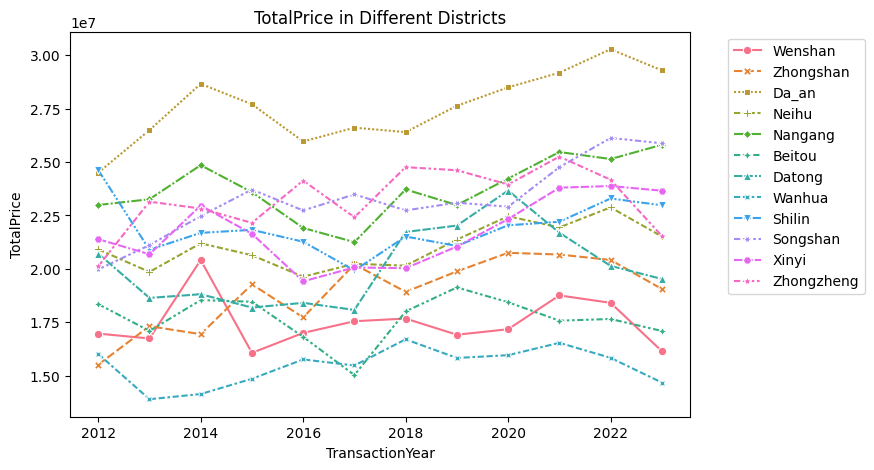

In [53]:
# District 各年的交易量 (line plot)
plt.figure(figsize=(8, 5))
sns.lineplot(data=df, x='TransactionYear', y='TotalPrice', hue='District', errorbar=None, style='District', markers=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('TotalPrice in Different Districts')
plt.show()

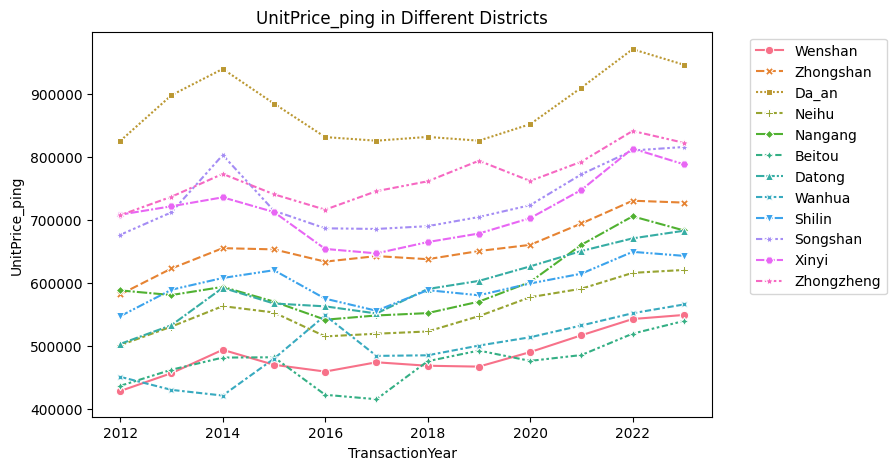

In [54]:
# District 各年的交易量 (line plot)
plt.figure(figsize=(8, 5))
sns.lineplot(data=df, x='TransactionYear', y='UnitPrice_ping', hue='District', errorbar=None, style='District', markers=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('UnitPrice_ping in Different Districts')
plt.show()

In [ ]:
plt.figure(figsize=(15,8))
sns.boxplot(data=df, x='TransactionYear', y='TotalPrice', color='#F0A986')
plt.title('TotalPrice in TransactionYear')
plt.show()

In [55]:
# Calculate the correlation matrix
#corr_values = df_num.corr()

# Filter columns where correlation with 'TotalPrice' is greater than 0.3
#corr_values_filter = corr_values[abs(corr_values['TotalPrice']) < 0.1]

# Print the filtered correlation values
#print(corr_values_filter['TotalPrice'])

<class 'pandas.core.frame.DataFrame'>
Index: 104260 entries, 0 to 104260
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Type          104260 non-null  object 
 1   HouseAge      104260 non-null  int64  
 2   TotalArea     104260 non-null  float64
 3   Floor_Arabic  104260 non-null  float64
 4   ParkingArea   104260 non-null  float64
 5   TotalPrice    104260 non-null  int64  
dtypes: float64(3), int64(2), object(1)
memory usage: 9.6+ MB


<Figure size 2000x1500 with 0 Axes>

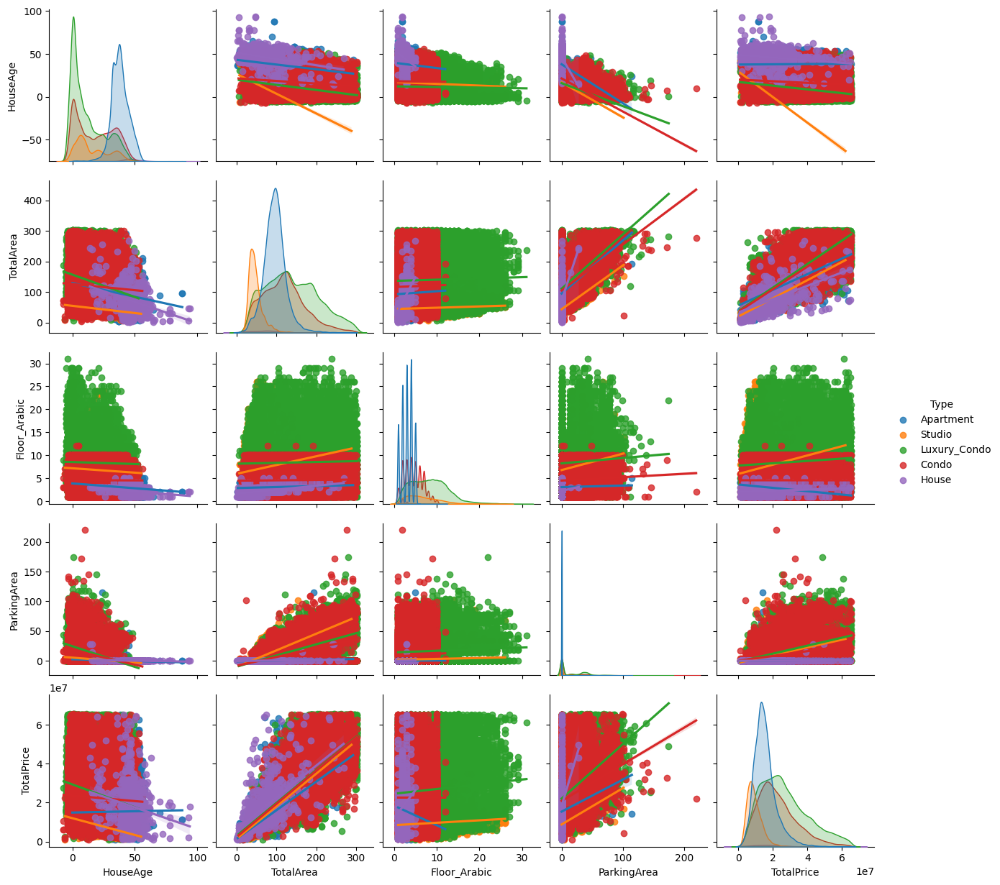

In [56]:
#df_IQR_type = df_IQR.drop(columns=['CompletionDate_AD', 'CompletionYear', 'CompletionMonth', 'TransactionDate_AD', 'TransactionMonth',
#                         'Address', 'Bathrooms', 'LivingRooms', 'PrimaryArea', 'BalconyArea', 'UnitPrice'], axis=1)
df_type = df[['Type', 'HouseAge', 'TotalArea', 'Floor_Arabic', 'ParkingArea', 'TotalPrice']]

df_type.info()
#df_IQR_num = df_IQR.select_dtypes(include = ['float64', 'int64'])
#df_IQR_type.to_csv('df_IQR_type.csv', encoding='utf-8-sig', index=False)
plt.figure(figsize=(20,15))
sns.pairplot(data=df_type, diag_kind='kde',hue='Type',kind='reg')
plt.show()

<class 'pandas.core.frame.DataFrame'>
Index: 104260 entries, 0 to 104260
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   TotalArea   104260 non-null  float64
 1   TotalPrice  104260 non-null  int64  
 2   District    104260 non-null  object 
dtypes: float64(1), int64(1), object(1)
memory usage: 7.2+ MB


<Figure size 3000x2500 with 0 Axes>

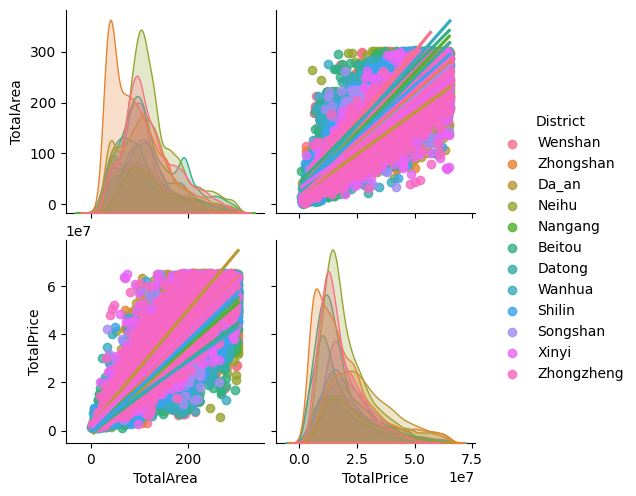

In [147]:
df_type = df[['TotalArea', 'TotalPrice', 'District']]

df_type.info()

plt.figure(figsize=(30,25))
sns.pairplot(data=df_type, diag_kind='kde',hue='District',kind='reg')
plt.show()

# 9-3. Boolean Type Data